In [1]:
#
from qutip import *
from numpy import real, cos, sin, exp, linspace,arccos, array, sqrt,pi
width = 3.45 #W
height = width #H (Or golden ratio)
import numpy as np
#The preamble of the text is:
import matplotlib as mpl
mpl.use('pdf')
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.mlab as mlab

import seaborn as sns
sns.set_context("paper")
sns.set(font_scale=1, style='white')
sns.set_style("ticks", {"xtick.major.size": 2.5, "ytick.major.size": 0, "xtick.direction": "in"})

cmap = sns.color_palette(n_colors=10)
#plt.rc('font', family='serif', serif='Times New Roman')
#plt.rc('font', family='serif', serif='Times New Roman')
#plt.rc('text', usetex=False)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
plt.rc('axes', labelsize=8)
import tqdm
from scipy.fft import fft, fftfreq



#
Iz = 0.5*sigmaz()
Ix = 0.5*sigmax()
Iy = 0.5*sigmay()
Ie = qeye(2)*0.5

In [94]:
def five_pulse_ESEEM(azz, azx, tau1, tau2, Tc, N=1):
    
    U0 = ((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm())
    U1 = ((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = ((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm())
    V1 = ((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())
    
    if N==1:
        tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
        tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
        tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
        tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
        return [tt1, tt2, tt3, tt4]
    else:
        U0 = (((-1j*WL*Iz*tau1).expm())**(N%2)) * (U0**(N//2))
        U1 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())**(N%2)) * (U1**(N//2))
        V0 = (((-1j*WL*Iz*tau2).expm())**(N%2)) * (V0**(N//2))
        V1 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())**(N%2)) * (V1**(N//2))
        tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
        tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
        tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
        tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
        return [tt1, tt2, tt3, tt4]
############################################################################

def five_pulse_ESEEM_old(azz, azx, tau1, tau2, Tc, N=1):
    
    U0 = ((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm())
    U1 = ((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = ((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm())
    V1 = ((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())
    
    if N==1:
        tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
        tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
        tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
        tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
        return [tt1, tt2, tt3, tt4]
    else:
        U0 = (U0**(N%2)) * ((U1*U0)**(N//2))
        U1 = (U1**(N%2)) * ((U0*U1)**(N//2))
        V0 = (V0**(N%2)) * ((V1*V0)**(N//2))
        V1 = (V1**(N%2)) * ((V0*V1)**(N//2))
        tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
        tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
        tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
        tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
        return [tt1, tt2, tt3, tt4]
############################################################################

def pulses(azz, azx, tau1, tau2, Tc, N=1):
    
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    
    tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
    tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
    tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
    tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
    return [tt1, tt2, tt3, tt4]
############################################################################
def Term1N(azz, azx, tau1, tau2, Tc, N):
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    return (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()

def Term2N(azz, azx, tau1, tau2, Tc, N):
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    return (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()

def Term3N(azz, azx, tau1, tau2, Tc, N):
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    return (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()

def Term4N(azz, azx, tau1, tau2, Tc, N):
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    return (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()

# one strong nuclear spin
I want to see how is the spectrum of one nuclear spin. Then, go to blind spot.

In [26]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204]) # kHz
Azx = np.array([64.4]) # kHz
Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204] kHz
Azx=[64.4] kHz
Freq hyp up=[153.92010915] kHz
Blind Spot up=[0.00649688] ms


Freq Larmor=64.2 kHz
Azz=[-204] kHz
Azx=[64.4] kHz
Freq hyp up=[153.92010915] kHz
Blind Spot up=[0.00649688] ms


<IPython.core.display.Javascript object>


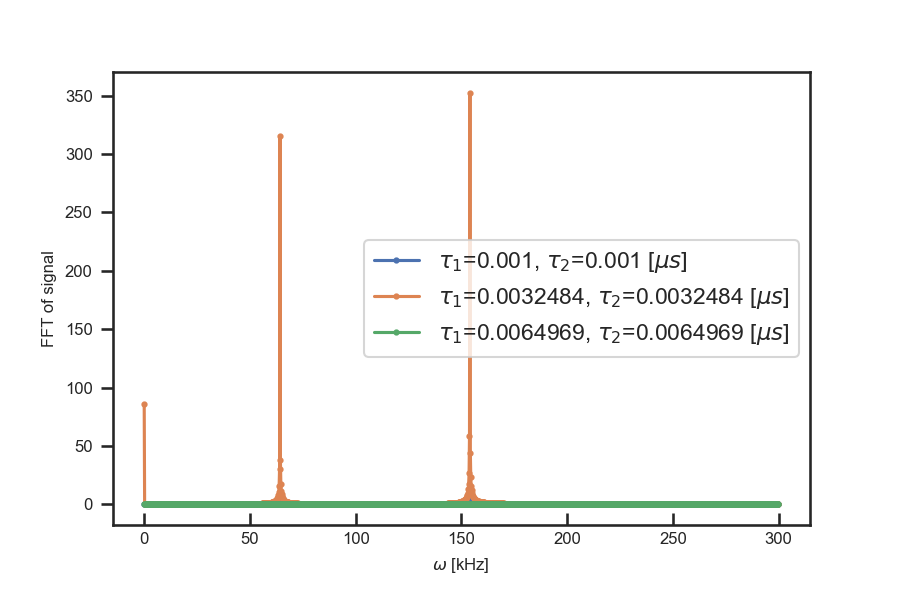

C:\Users\User\AppData\Local\Temp/ipykernel_26692/736734545.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


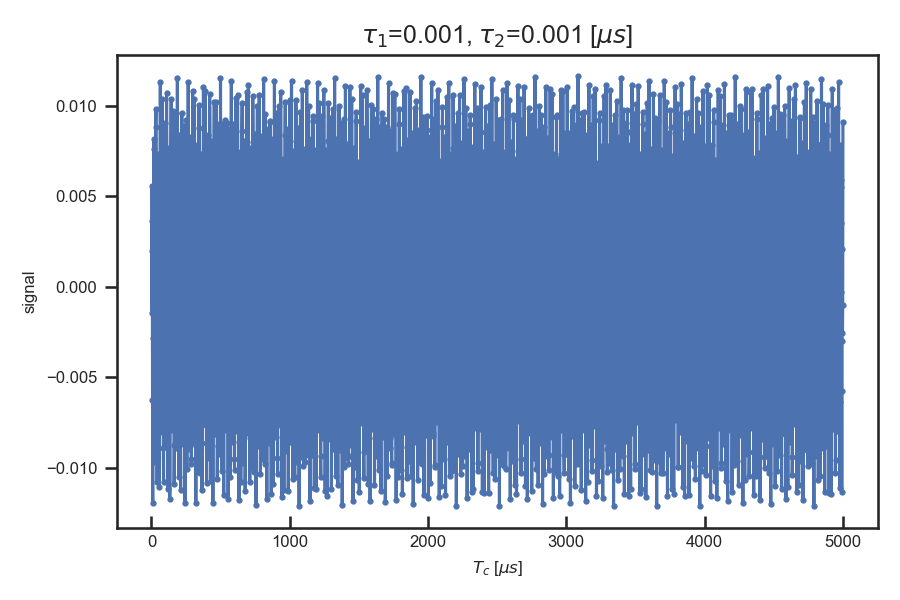

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


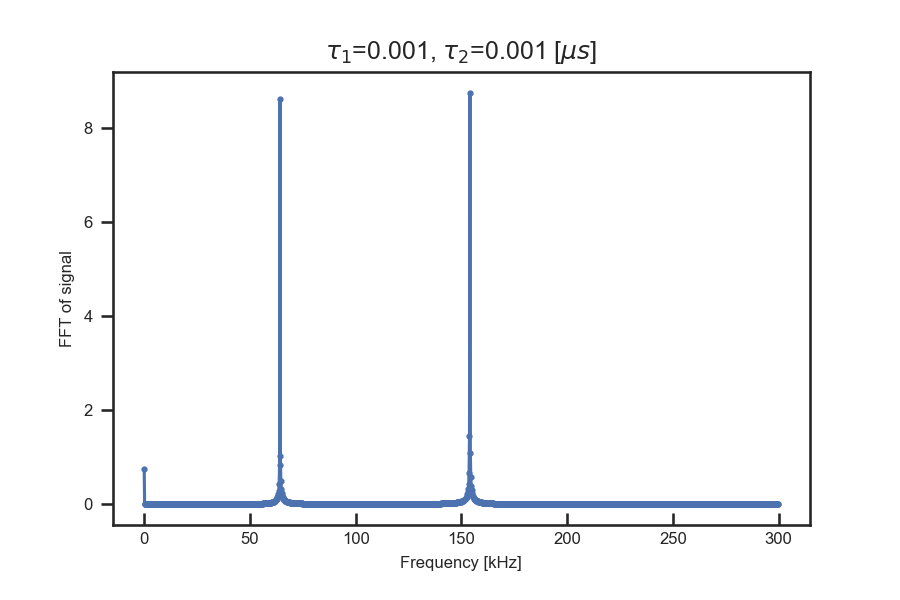

C:\Users\User\AppData\Local\Temp/ipykernel_26692/736734545.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


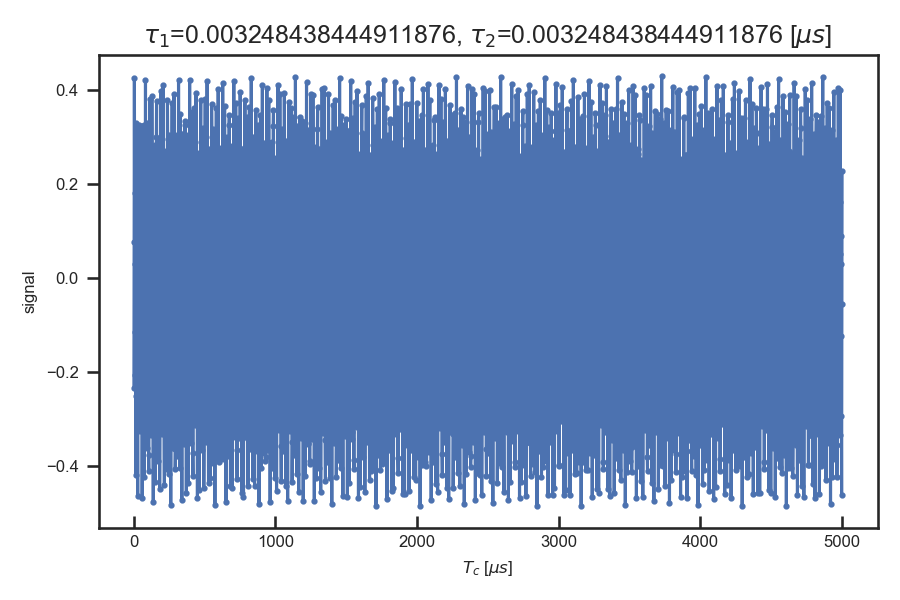

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


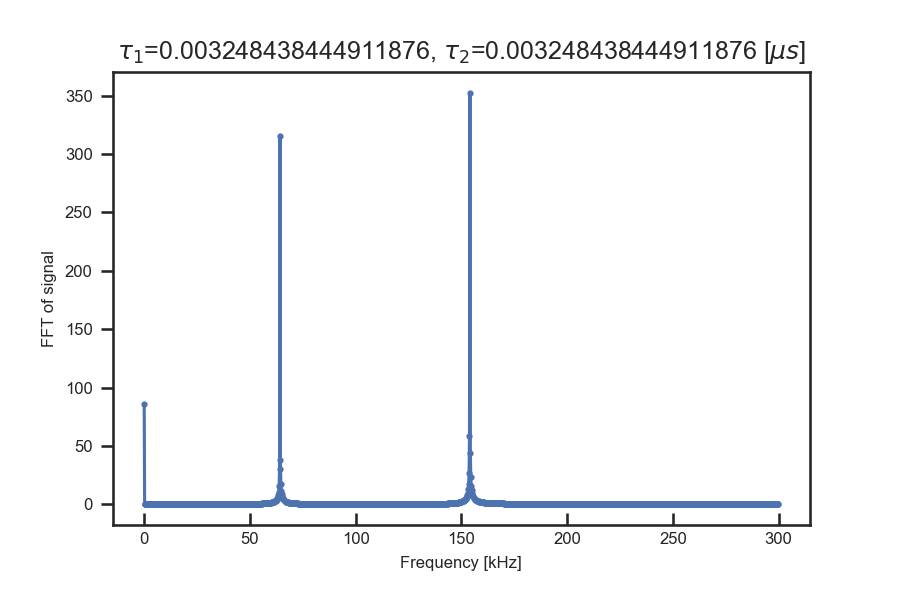

C:\Users\User\AppData\Local\Temp/ipykernel_26692/736734545.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


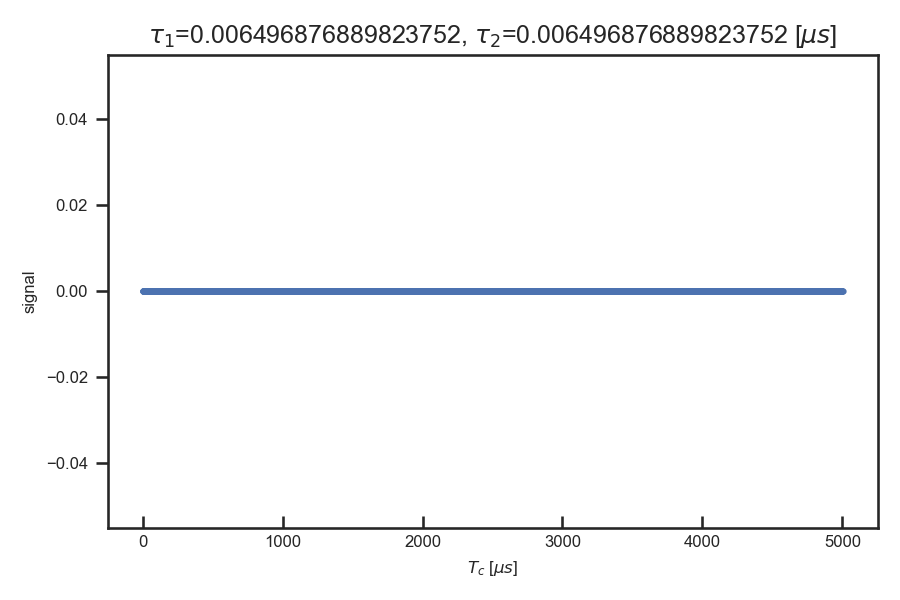

<IPython.core.display.Javascript object>


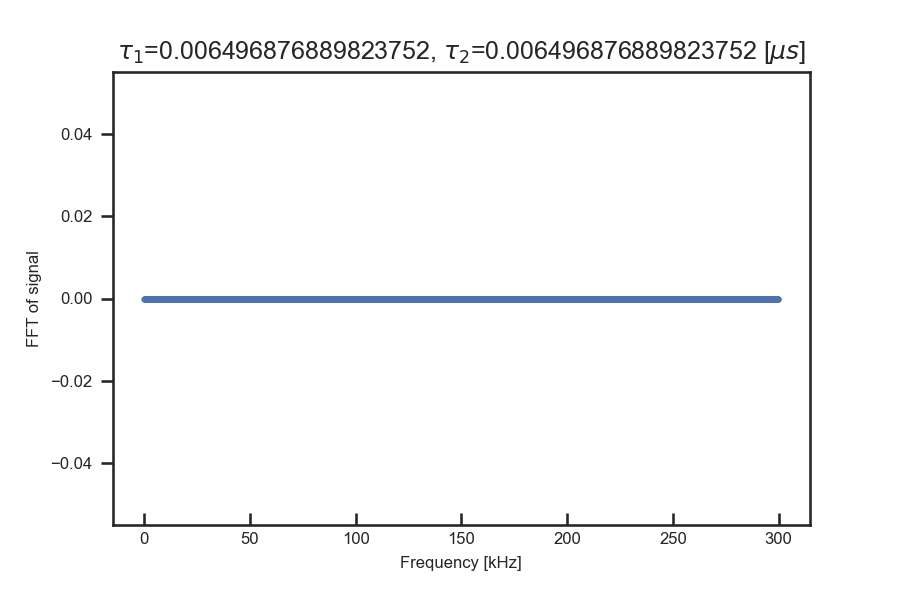

In [27]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1 in [0.001, 0.5*BS_up[0], BS_up[0]]:
    tau2=tau1
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(1000*Tc, signal,'-o',markersize=2, alpha = 1)
    ax.set_xlabel(r'$T_c$ [$\mu s$]')
    ax.set_ylabel(r'signal')
    ax.tight_layout()

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

Signal consist of four terms. Let's see how each of them behave

Conclusion:
1. Term1 = - Term2 and Term3= -Term4
2. Term1 and 2 give larmor peak/ Term3 and 4 give hyperfine peak

On blind spots: Term1 and Term2 are zero. Term3 and Term 4 are equal!
Toward blind spots: domain of oscillations get less and less

Freq Larmor=64.2 kHz
Azz=[-204] kHz
Azx=[64.4] kHz
Freq hyp up=[153.92010915] kHz
Blind Spot up=[0.00649688] ms


C:\Users\User\AppData\Local\Temp/ipykernel_26692/1716717865.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


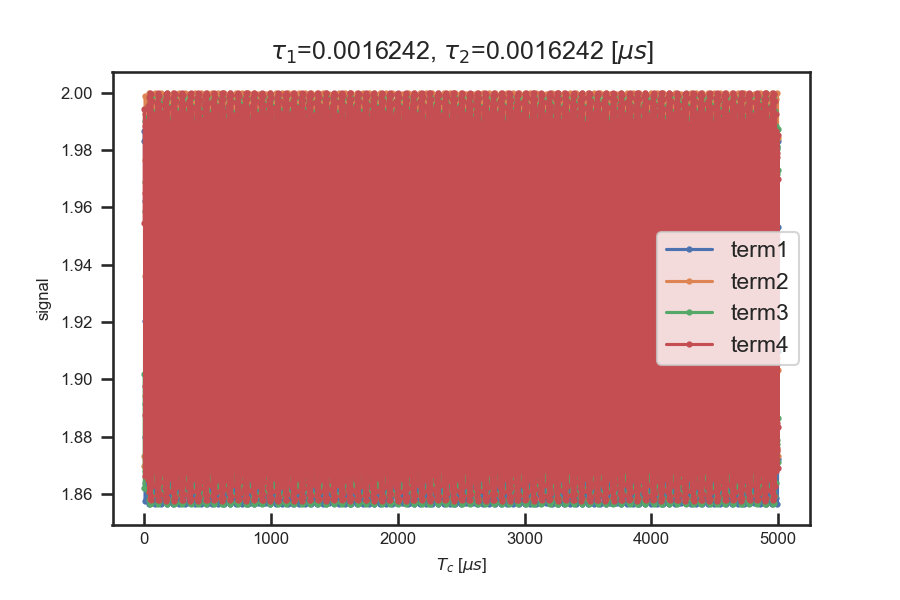

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


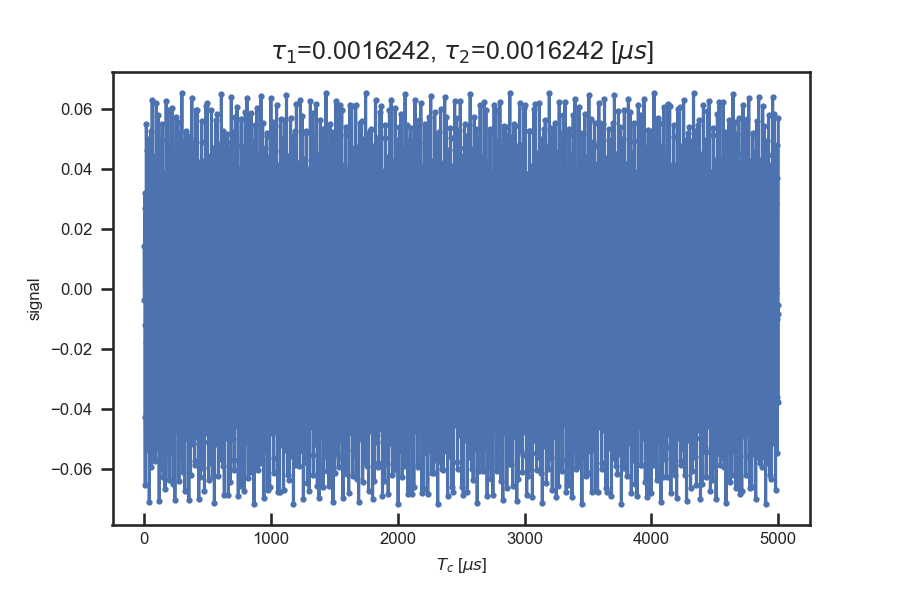

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


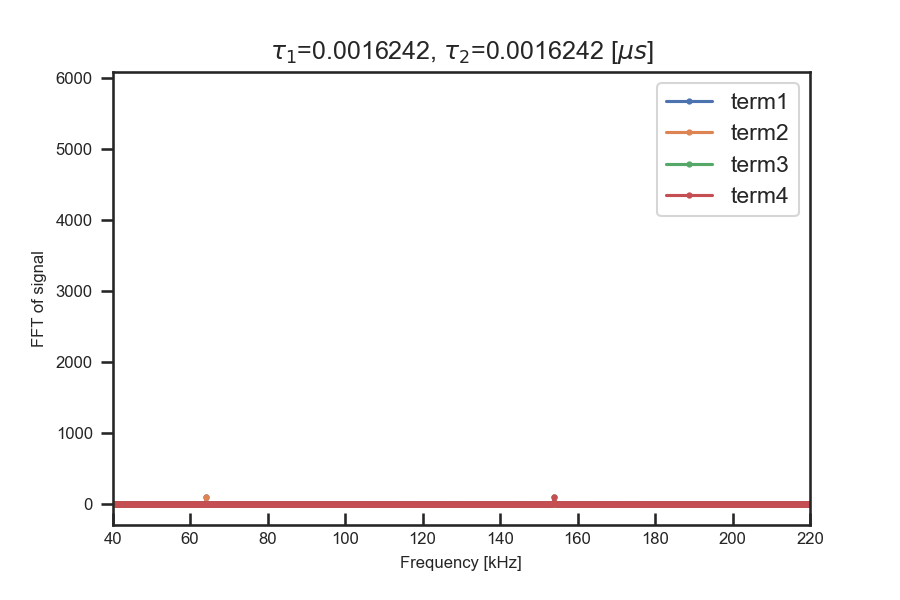

<IPython.core.display.Javascript object>


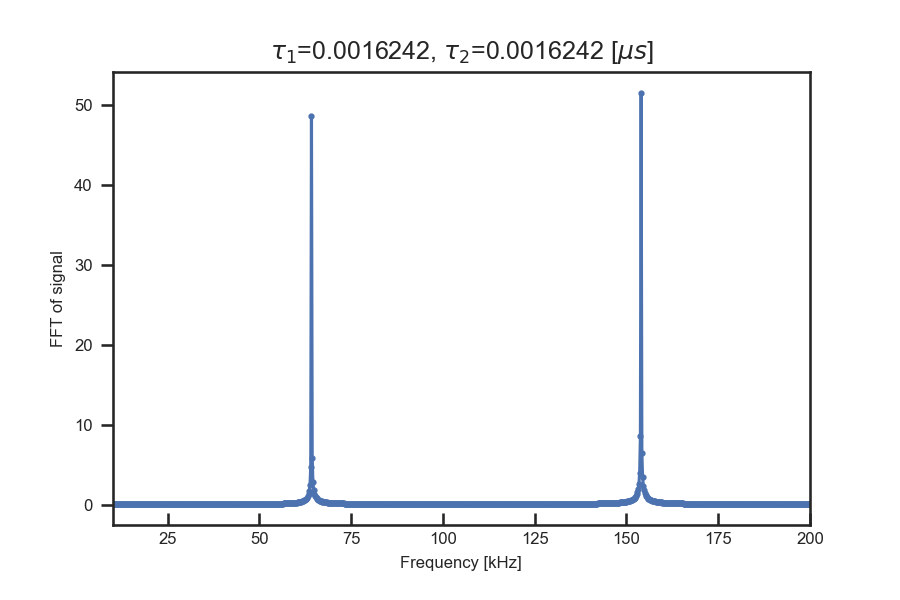

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1716717865.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


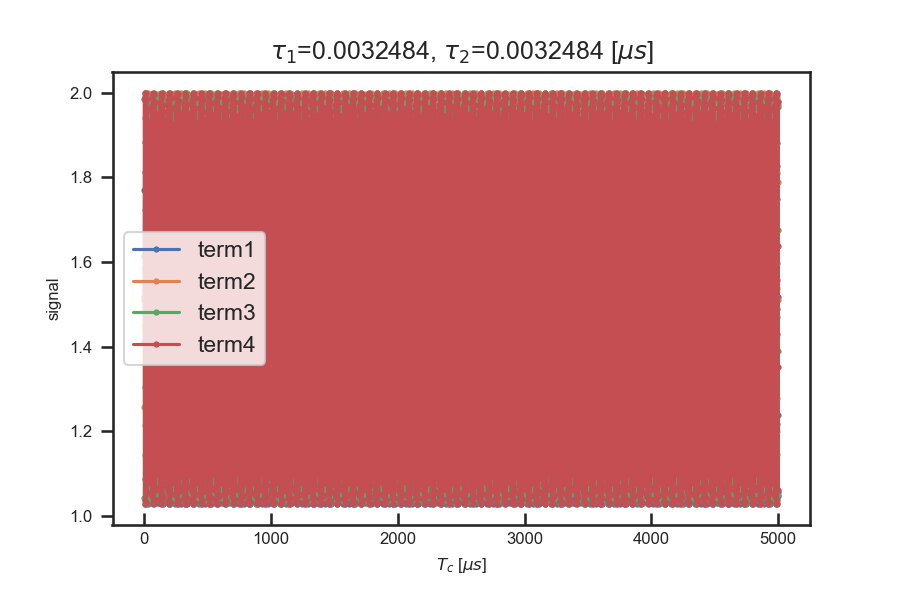

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


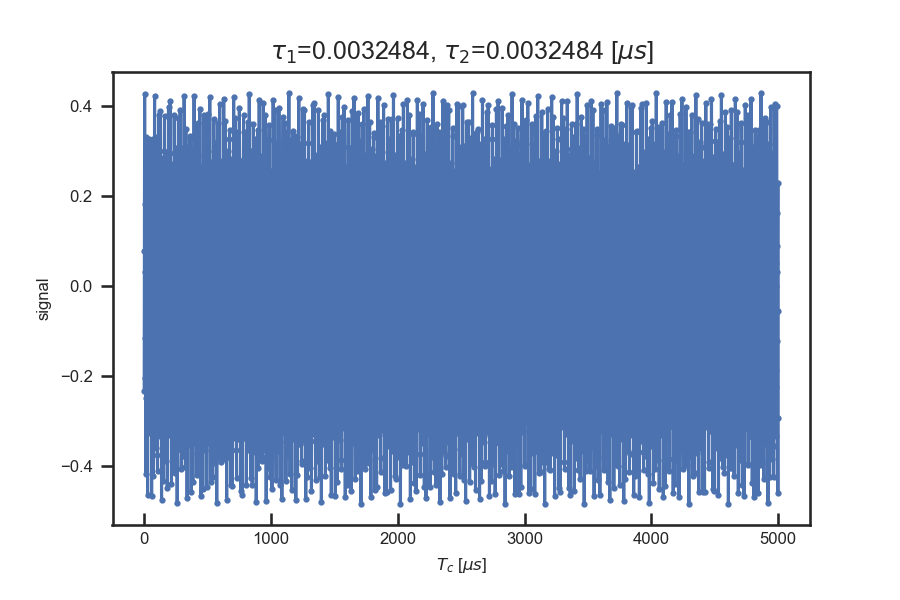

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


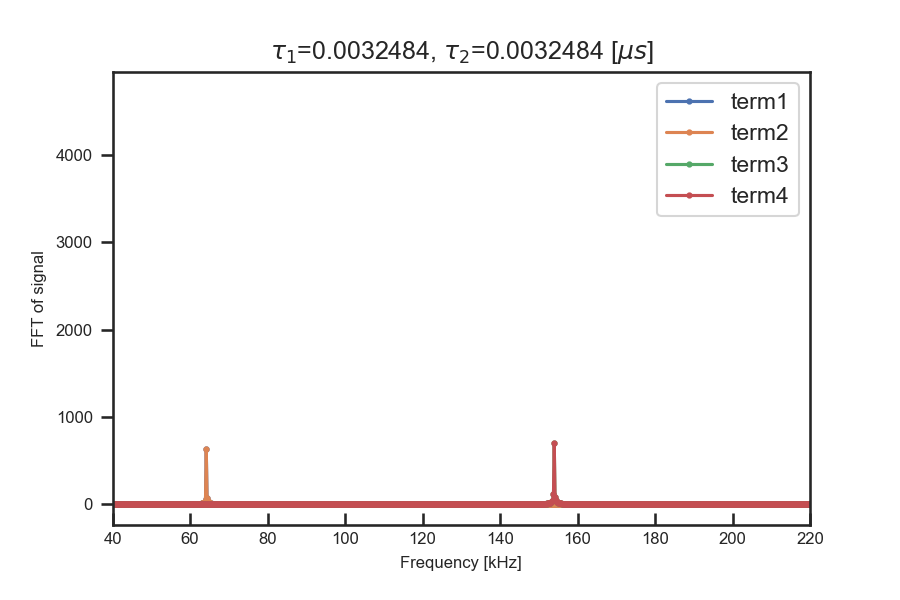

<IPython.core.display.Javascript object>


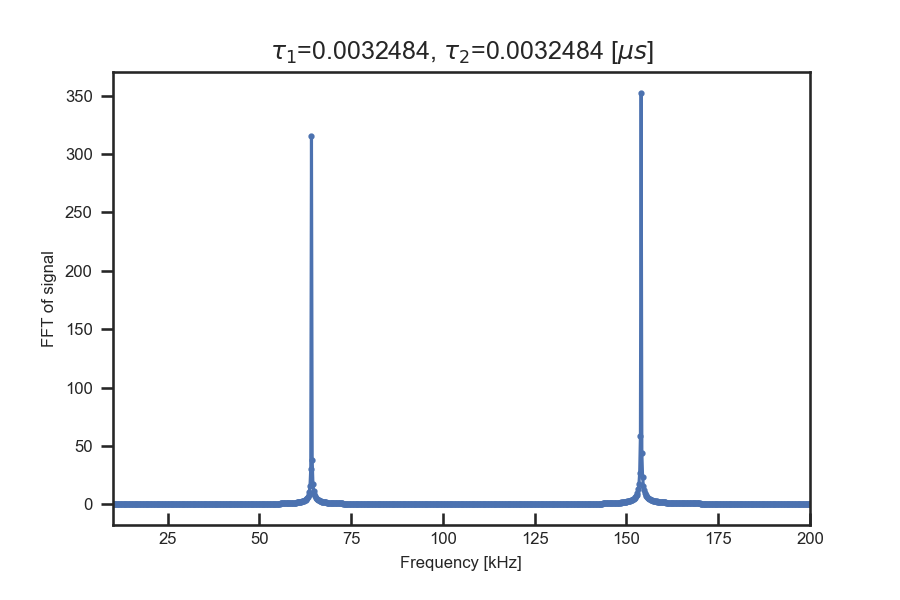

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1716717865.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


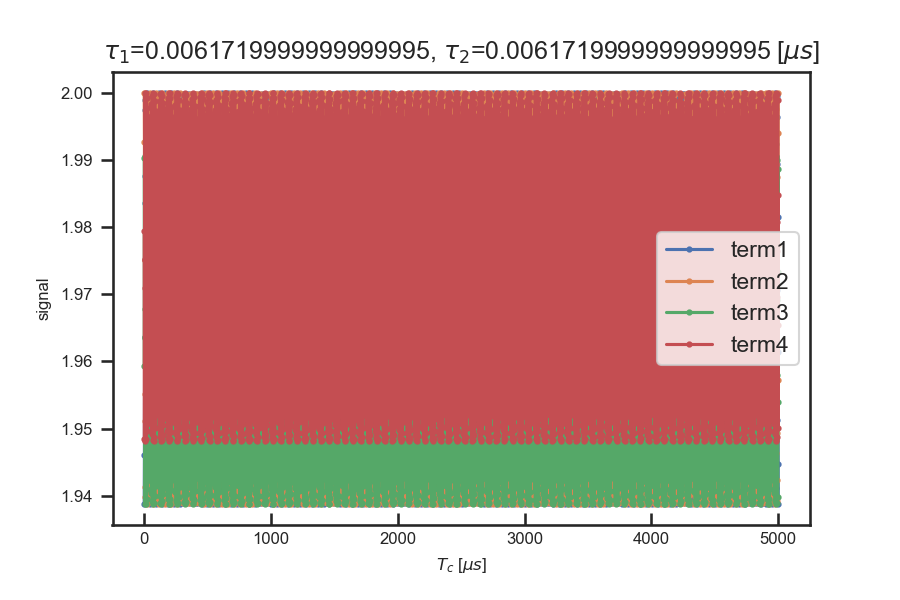

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


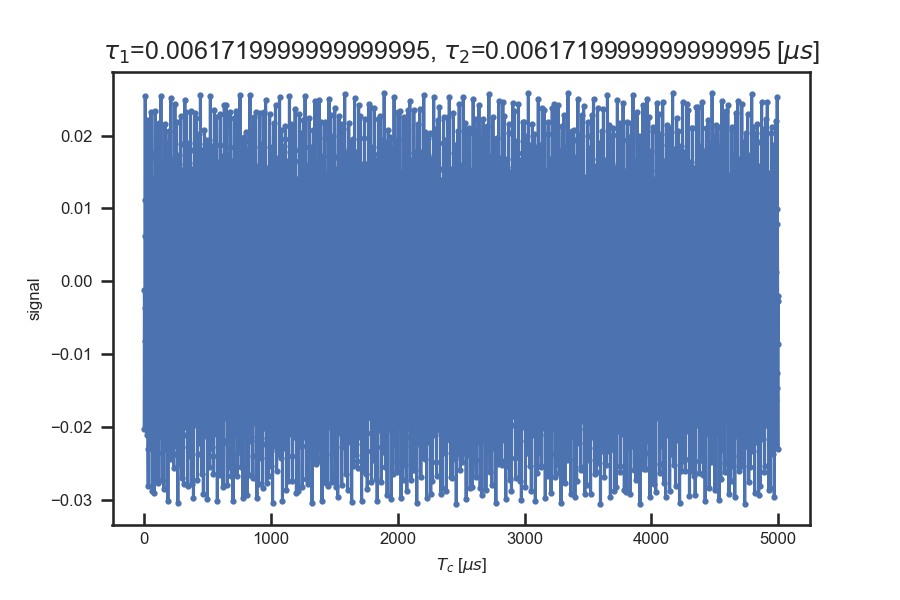

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


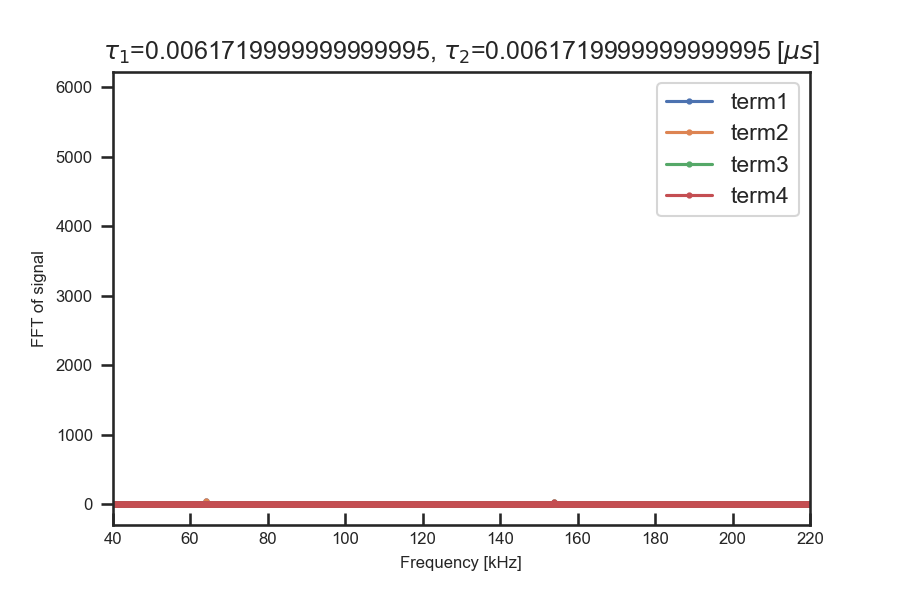

<IPython.core.display.Javascript object>


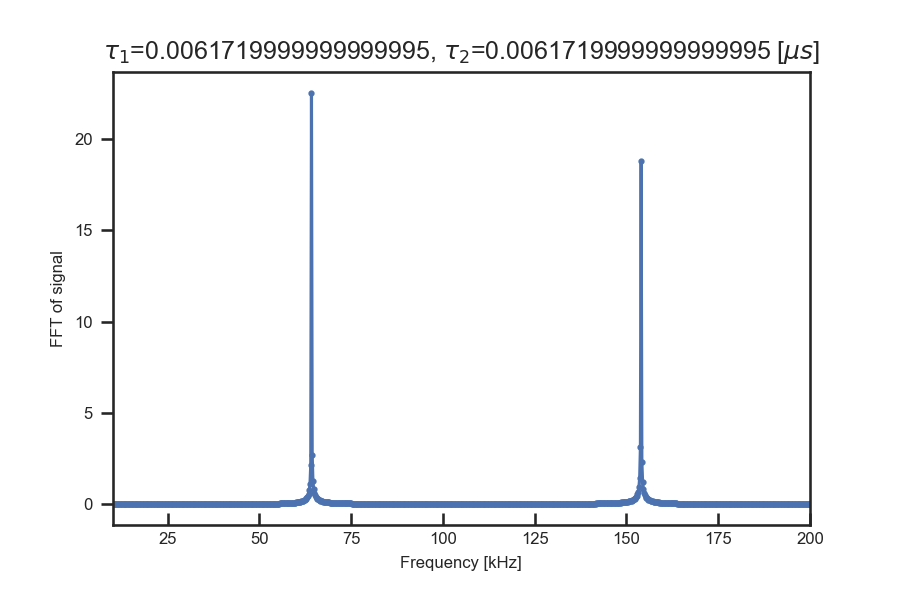

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1716717865.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


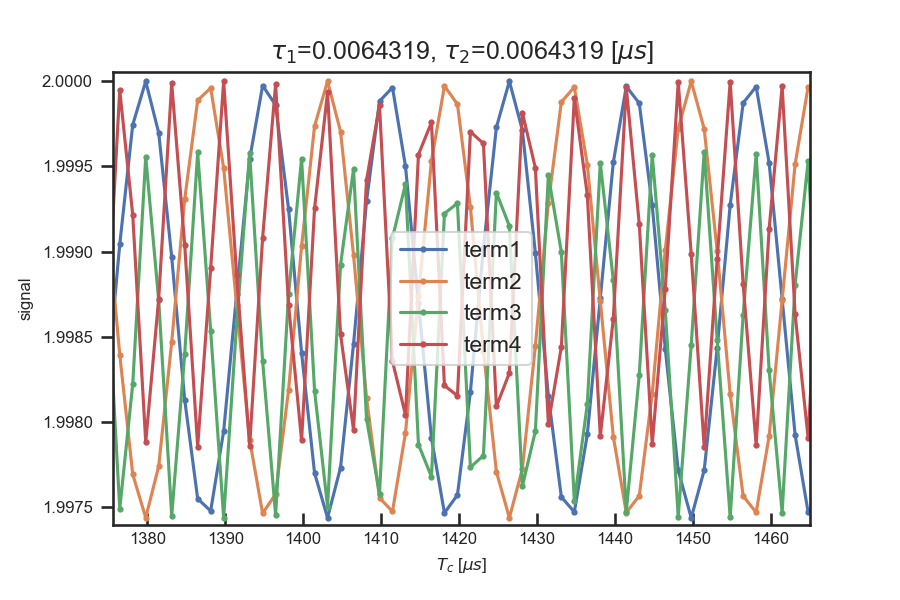

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


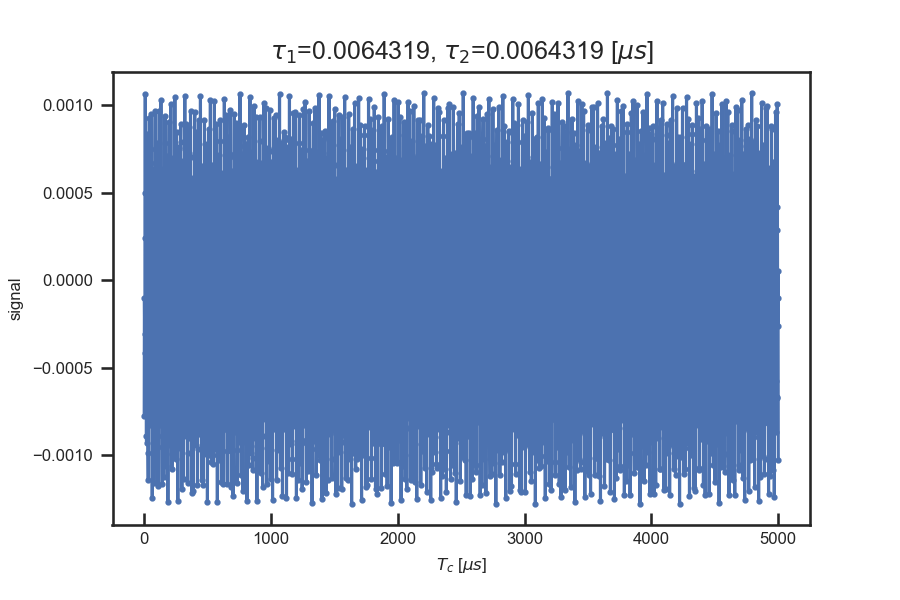

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


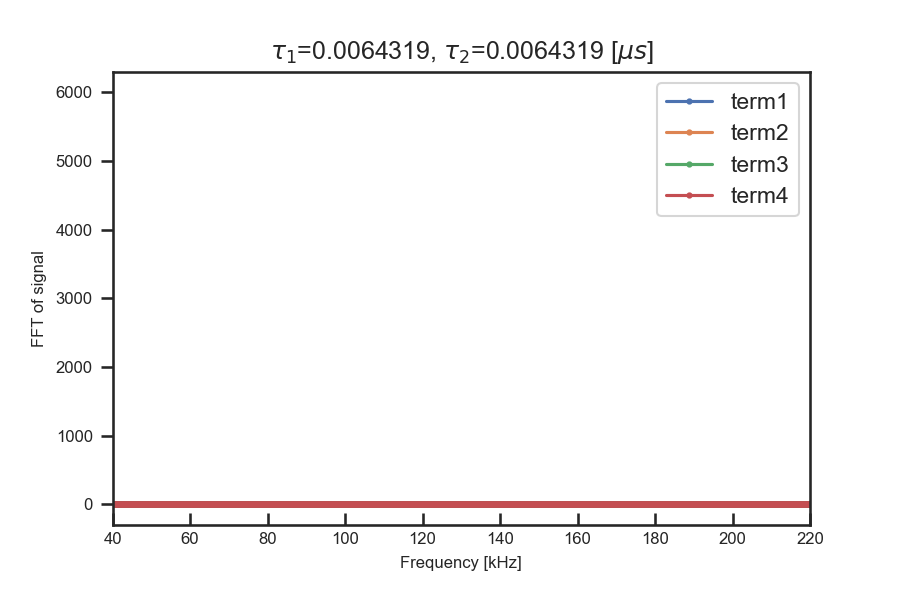

<IPython.core.display.Javascript object>


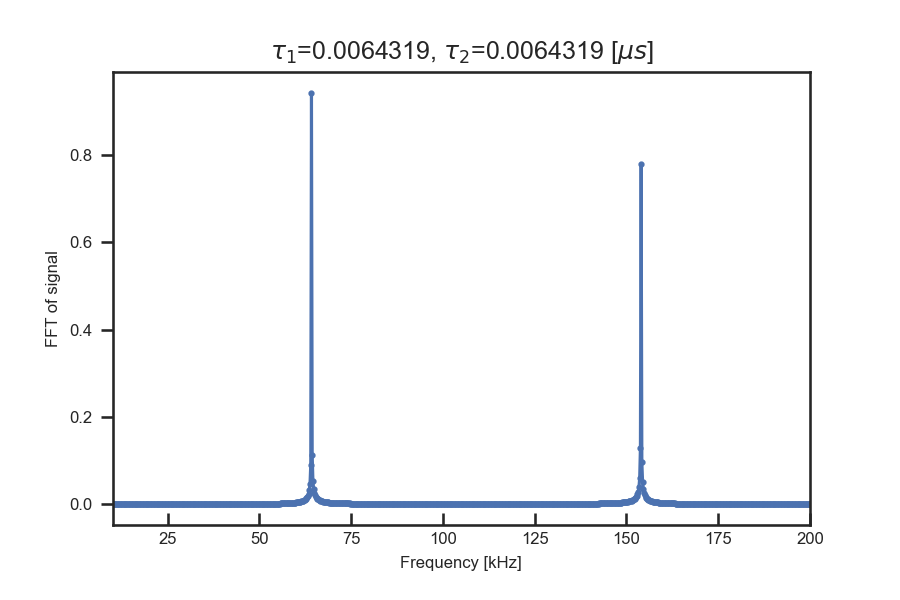

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1716717865.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


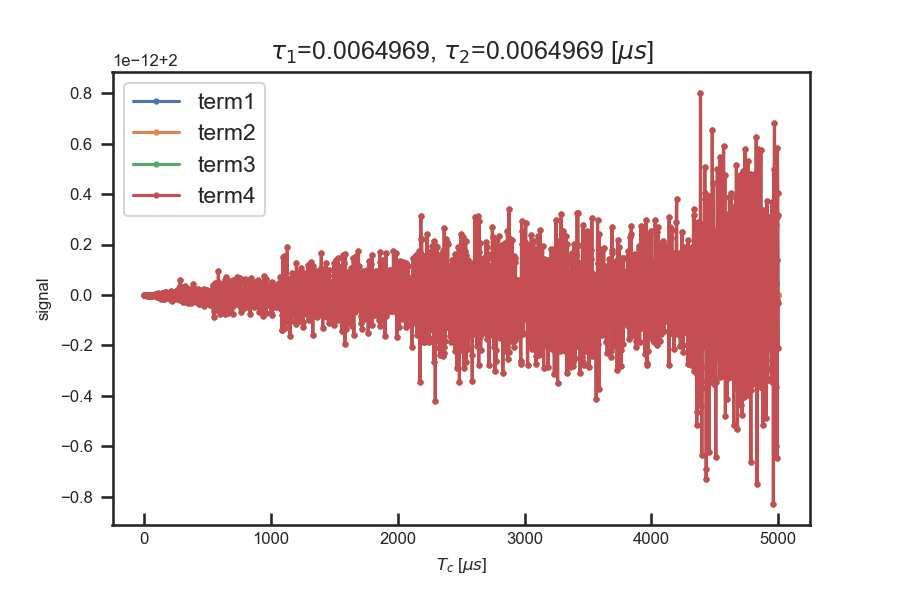

<IPython.core.display.Javascript object>


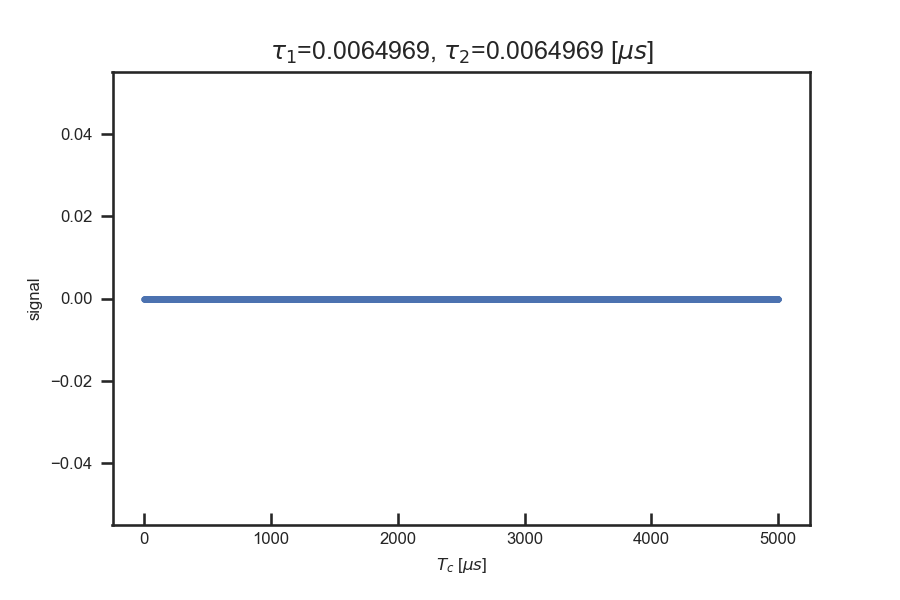

<IPython.core.display.Javascript object>


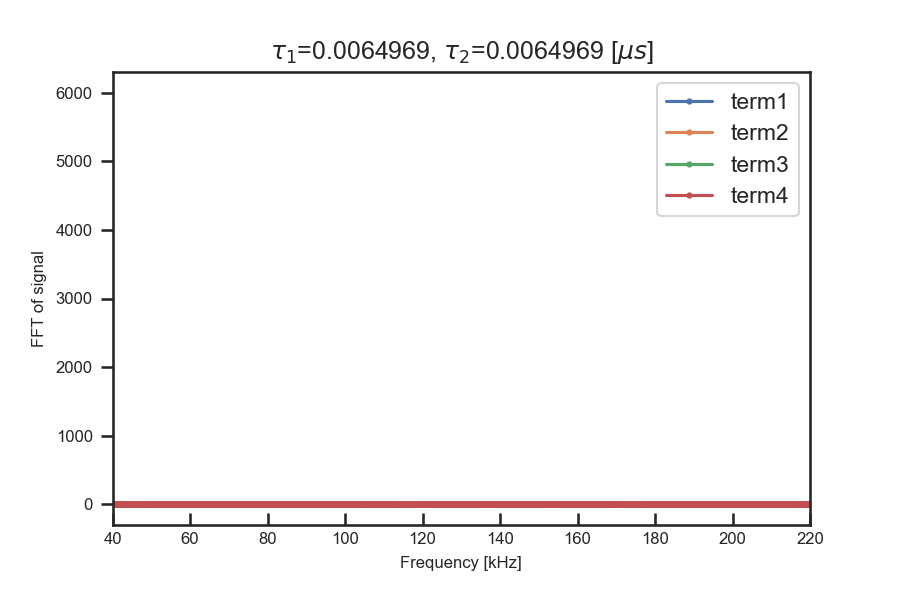

<IPython.core.display.Javascript object>


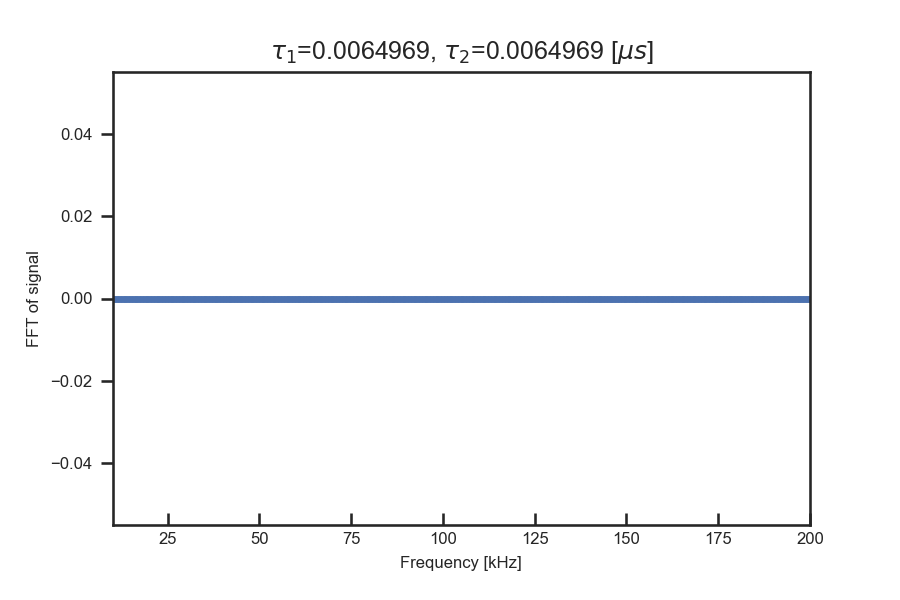

In [40]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

for tau1 in [0.25*BS_up[0],0.5*BS_up[0],0.95*BS_up[0], 0.99*BS_up[0], BS_up[0]]:
    tau2=tau1
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(1000*Tc, term1,'-o',markersize=2, alpha = 1, label='term1')
    ax.plot(1000*Tc, term2,'-o',markersize=2, alpha = 1, label='term2')
    ax.plot(1000*Tc, term3,'-o',markersize=2, alpha = 1, label='term3')
    ax.plot(1000*Tc, term4,'-o',markersize=2, alpha = 1, label='term4')
    ax.set_xlabel(r'$T_c$ [$\mu s$]')
    ax.set_ylabel(r'signal')
    ax.legend()
    
    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(1000*Tc, signal,'-o',markersize=2, alpha = 1)
    ax.set_xlabel(r'$T_c$ [$\mu s$]')
    ax.set_ylabel(r'signal')
    
    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term1))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term1")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term2))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term2")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term3))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term3")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term4))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term4")
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    ax.set_xlim(left=40, right=220)
    ax.legend()

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="signal")
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    ax.set_xlim(left=10,right=200)

# Two strong nuclear spins
How the spectrum is. Can we go to blind spot of both?

In [41]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204, 51.5]) # kHz
Azx = np.array([64.4, 143.6]) # kHz
Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204.    51.5] kHz
Azx=[ 64.4 143.6] kHz
Freq hyp up=[153.92010915 184.41108969] kHz
Blind Spot up=[0.00649688 0.00542267] ms


Freq Larmor=64.2 kHz
Azz=[-204.    51.5] kHz
Azx=[ 64.4 143.6] kHz
Freq hyp up=[153.92010915 184.41108969] kHz
Blind Spot up=[0.00649688 0.00542267] ms


<IPython.core.display.Javascript object>


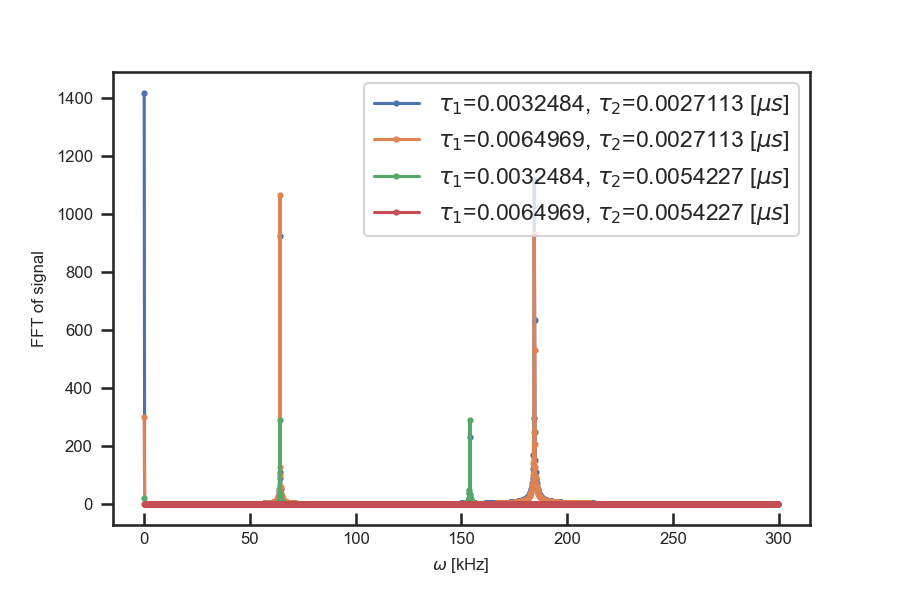

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1706188630.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


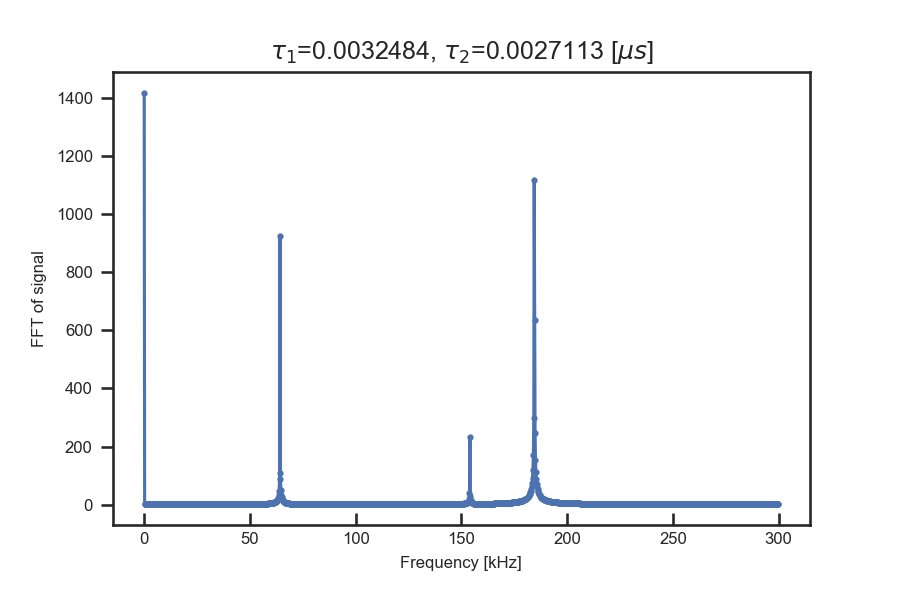

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1706188630.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


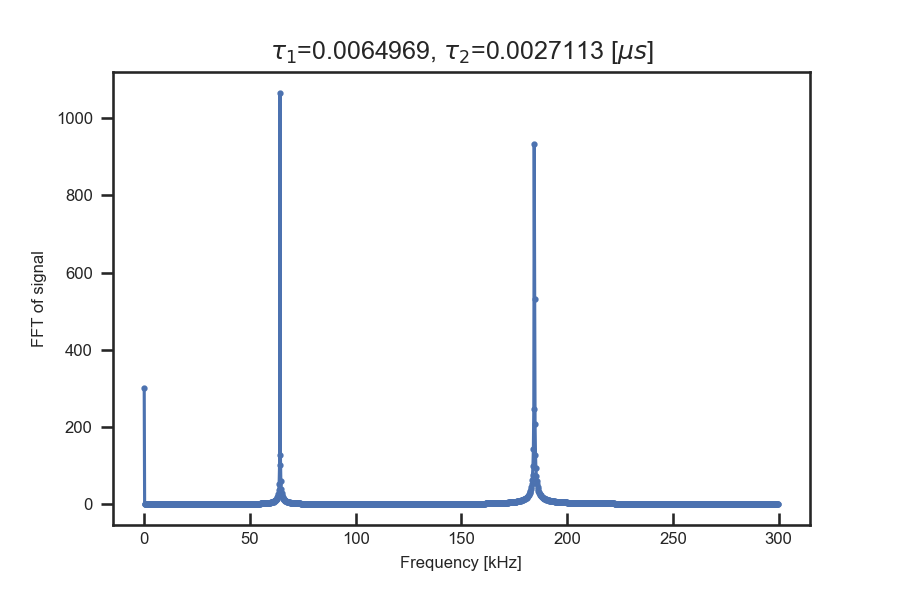

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1706188630.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


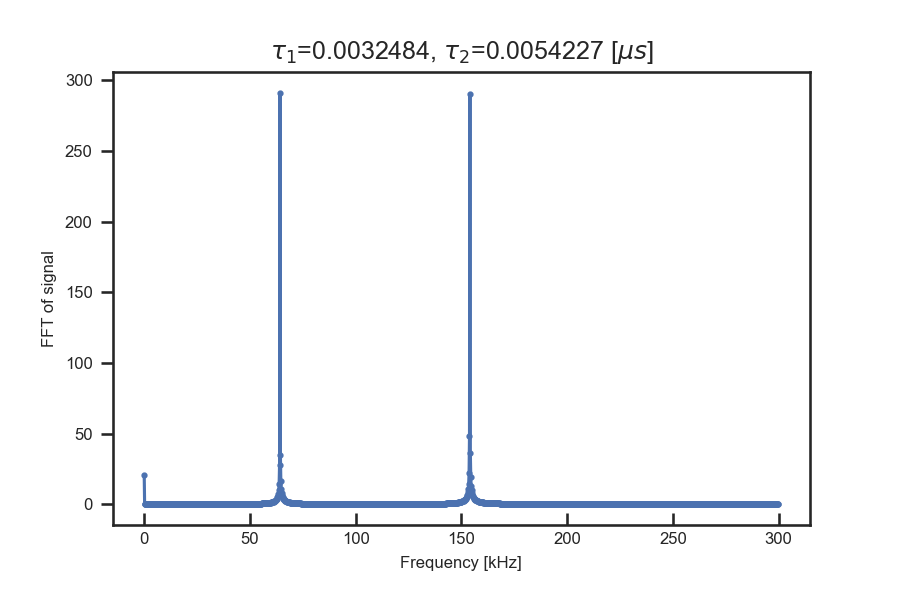

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1706188630.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


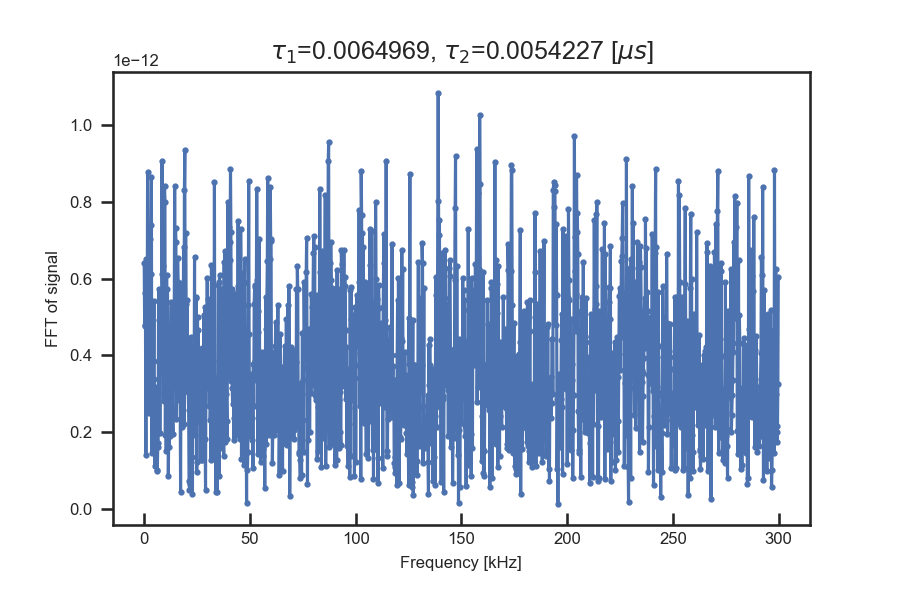

In [42]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[0.5*BS_up[0],0.5*BS_up[1]], [BS_up[0],0.5*BS_up[1]], [0.5*BS_up[0],BS_up[1]], [BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

Now let's look at each term seperately

Freq Larmor=64.2 kHz
Azz=[-204.    51.5] kHz
Azx=[ 64.4 143.6] kHz
Freq hyp up=[153.92010915 184.41108969] kHz
Blind Spot up=[0.00649688 0.00542267] ms


C:\Users\User\AppData\Local\Temp/ipykernel_26692/4127076567.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


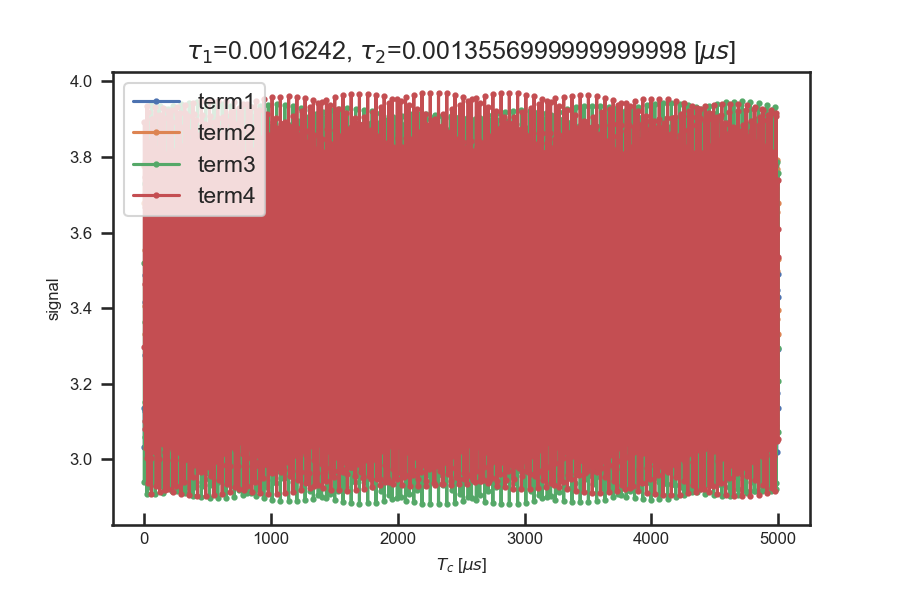

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


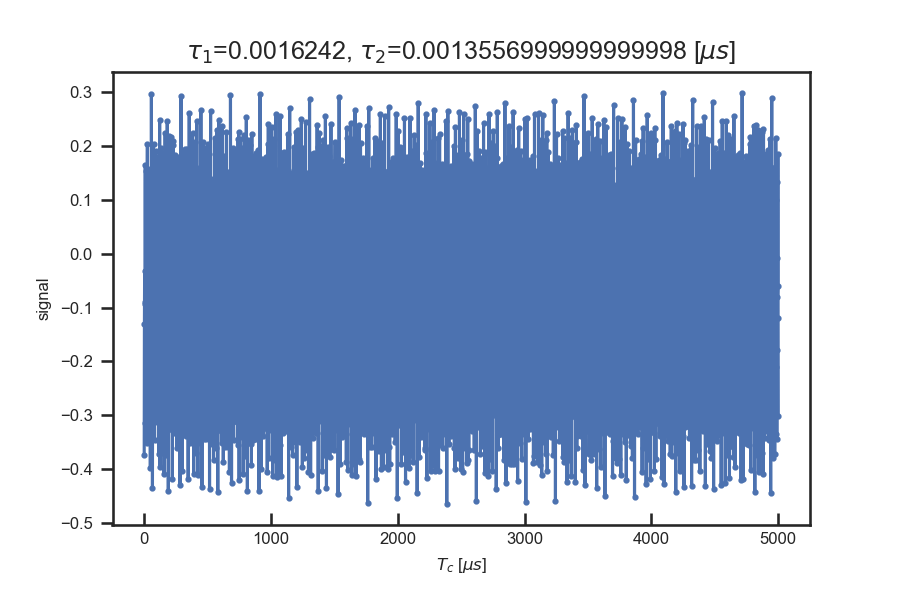

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


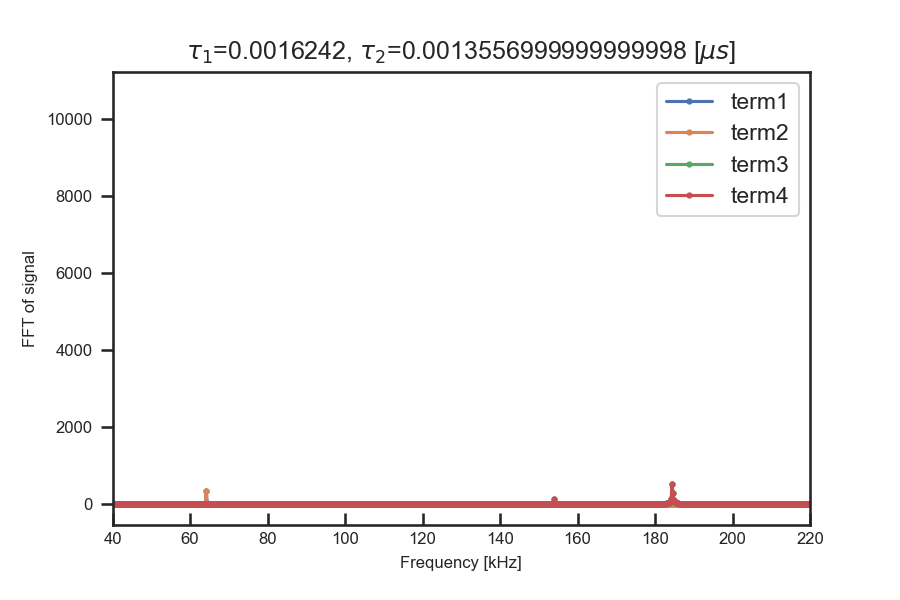

<IPython.core.display.Javascript object>


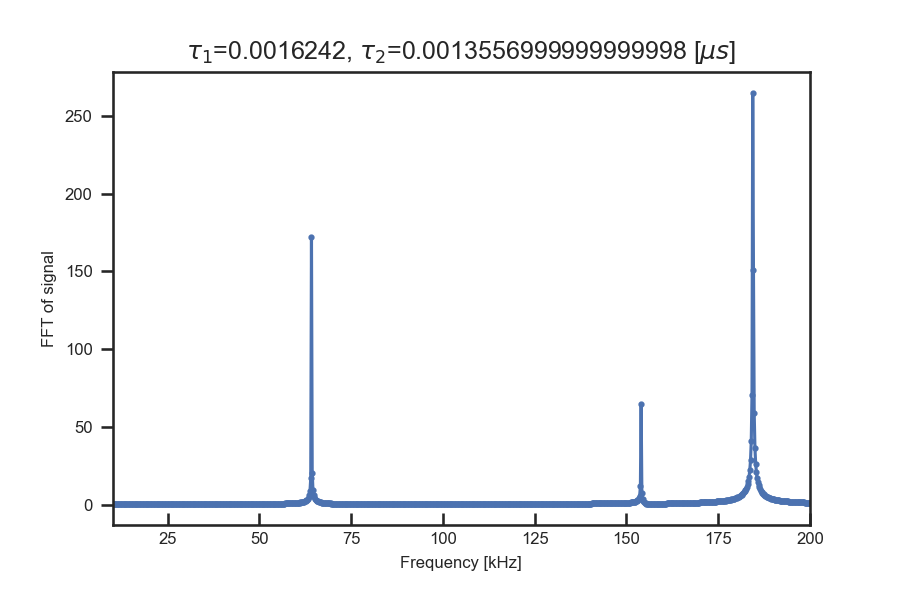

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4127076567.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


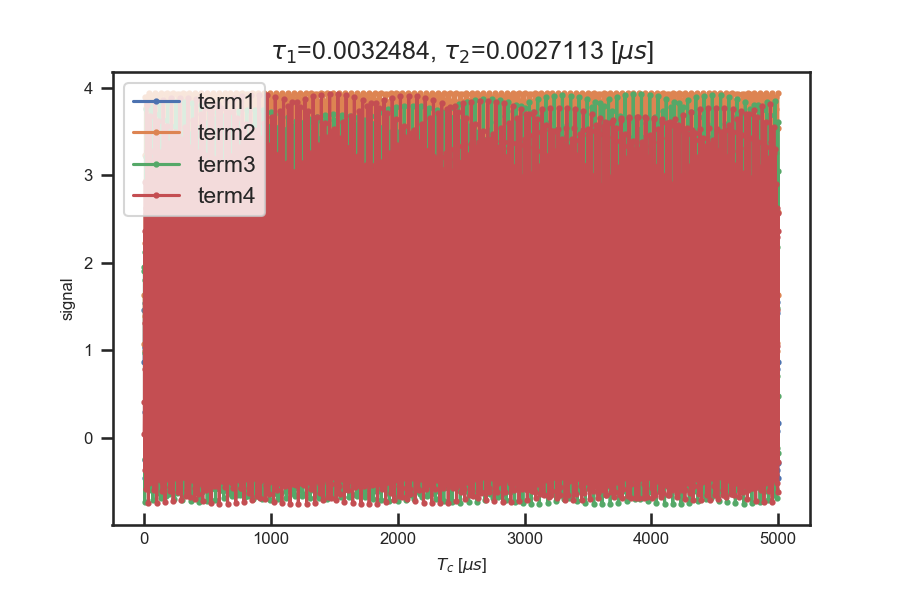

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


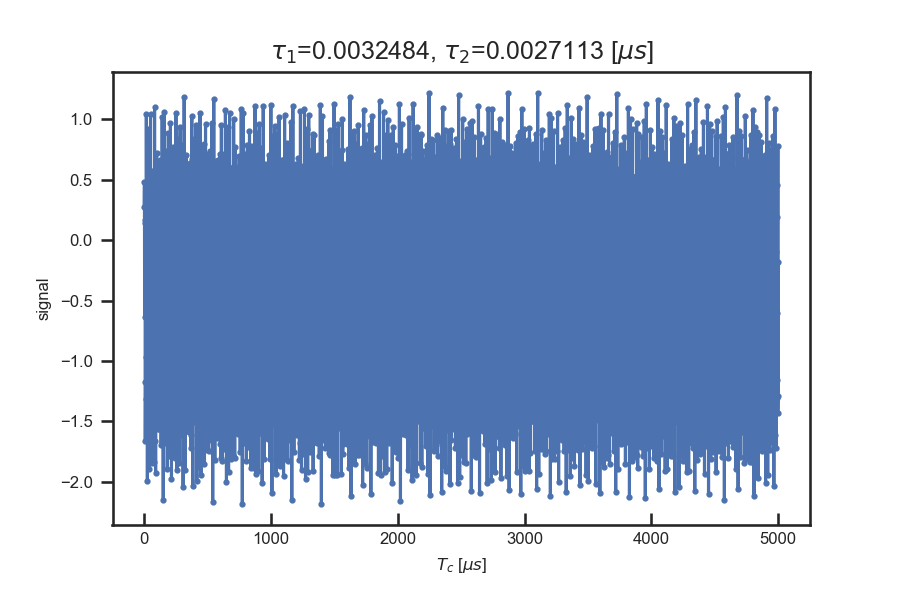

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


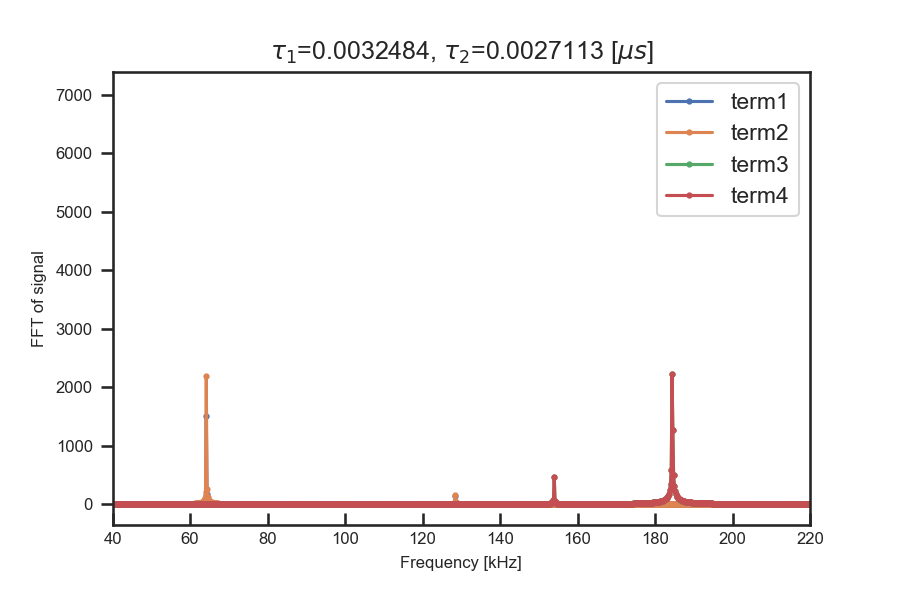

<IPython.core.display.Javascript object>


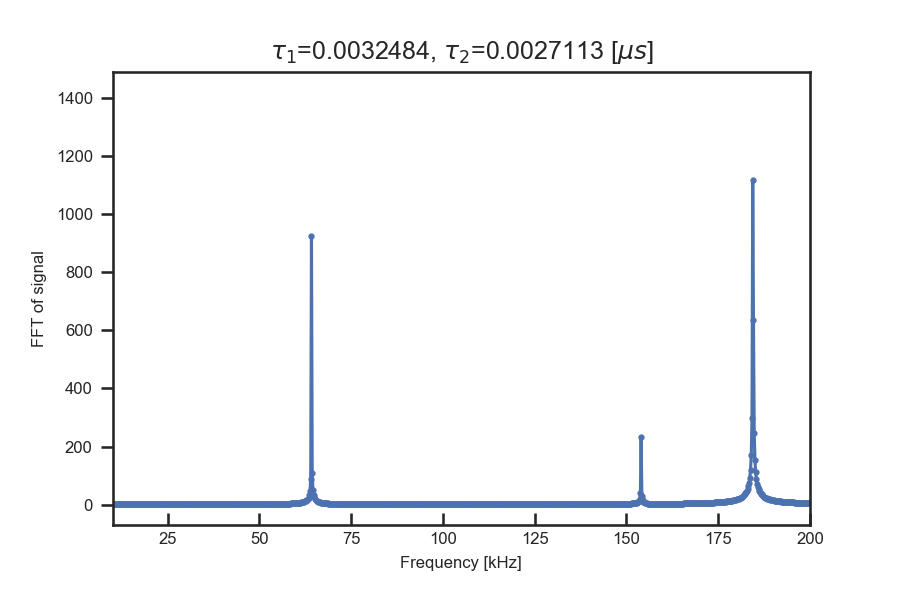

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4127076567.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


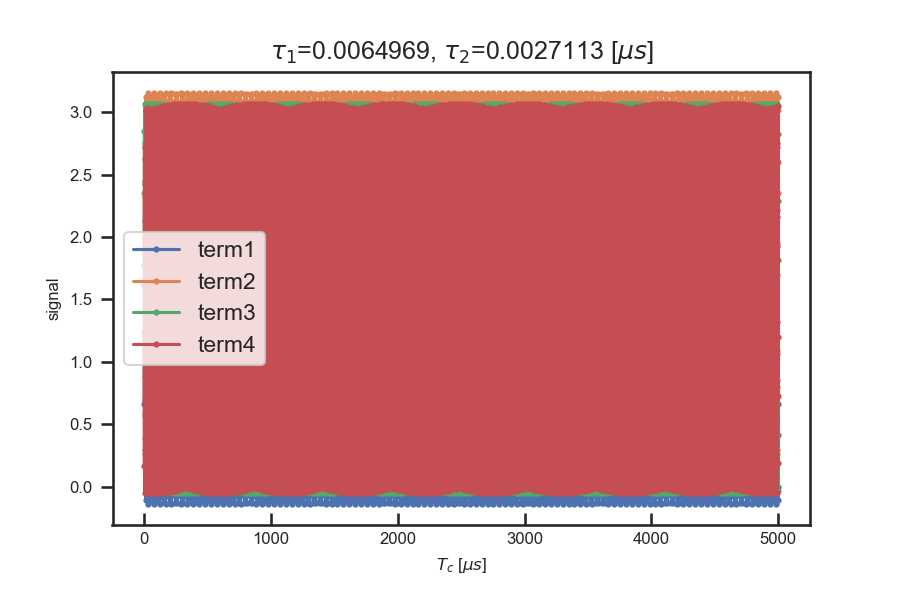

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


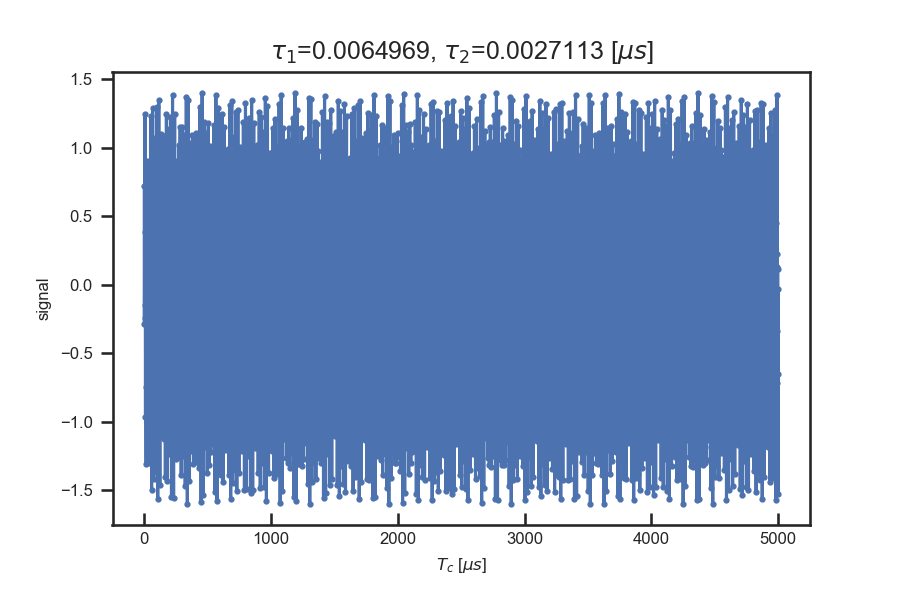

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


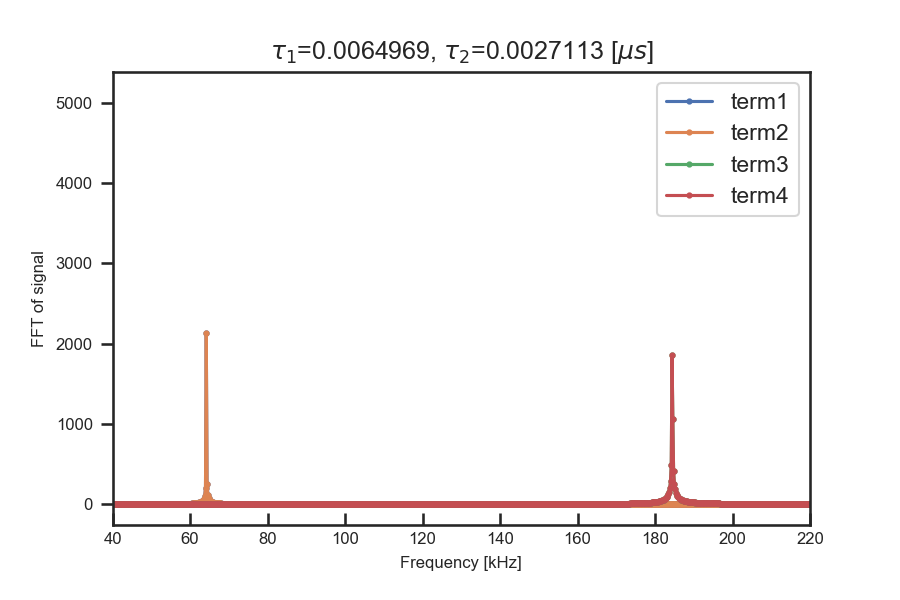

<IPython.core.display.Javascript object>


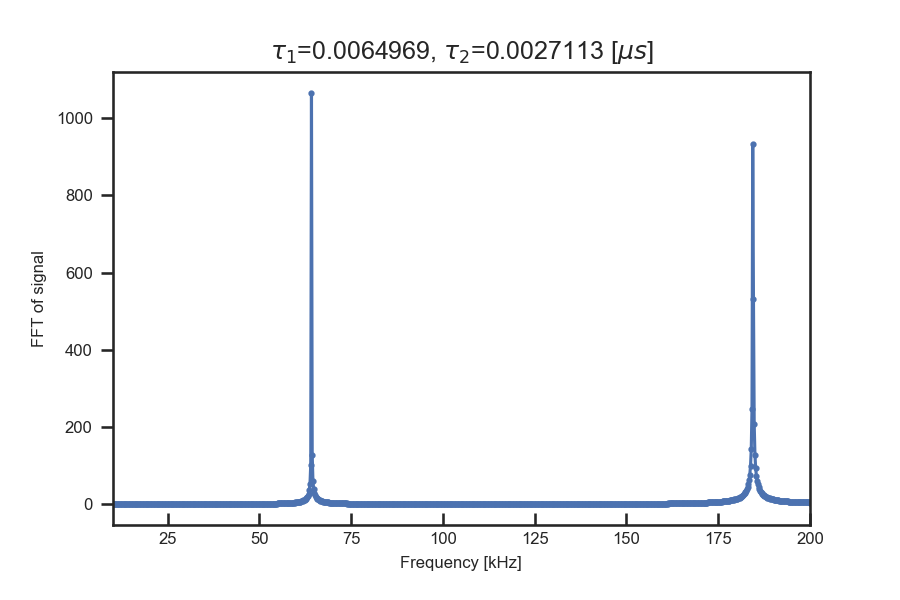

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4127076567.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


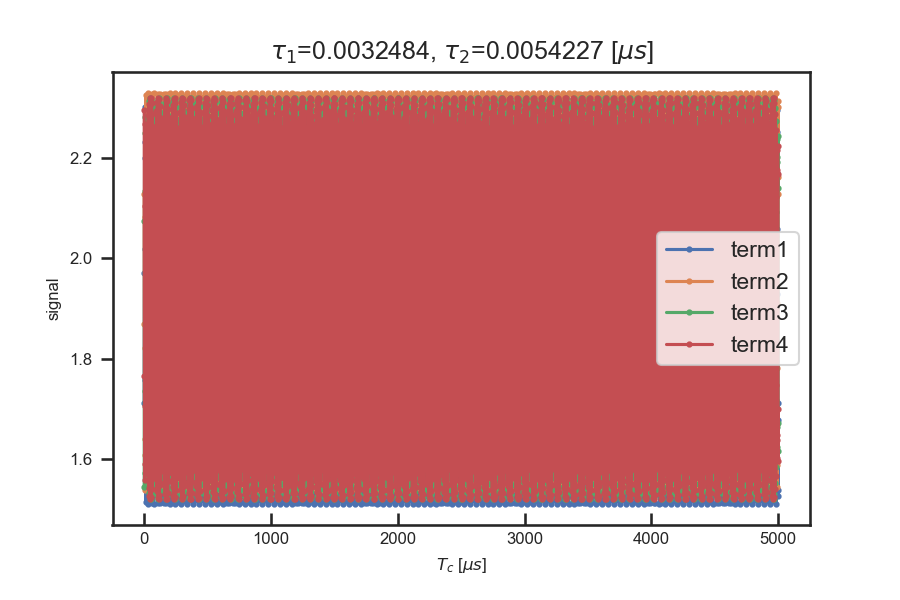

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


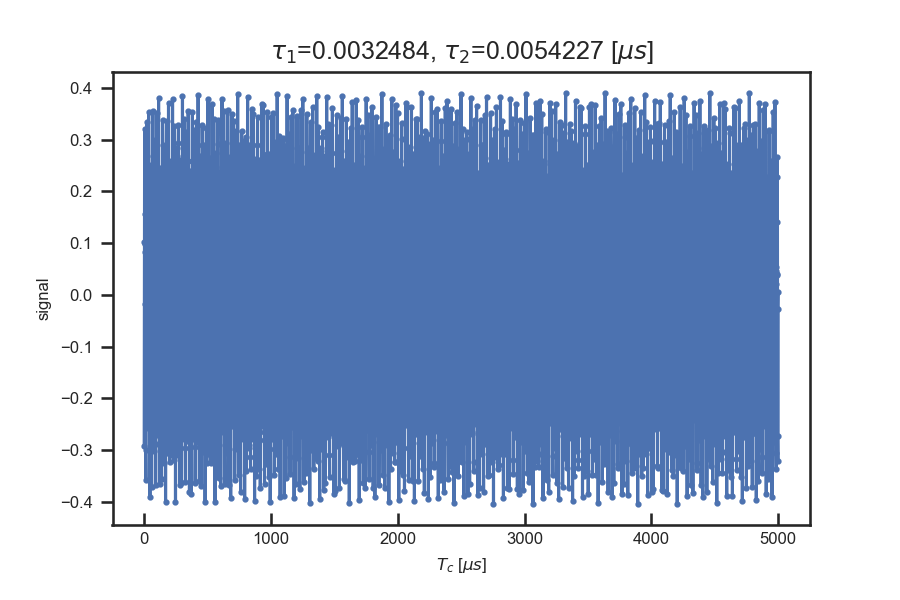

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


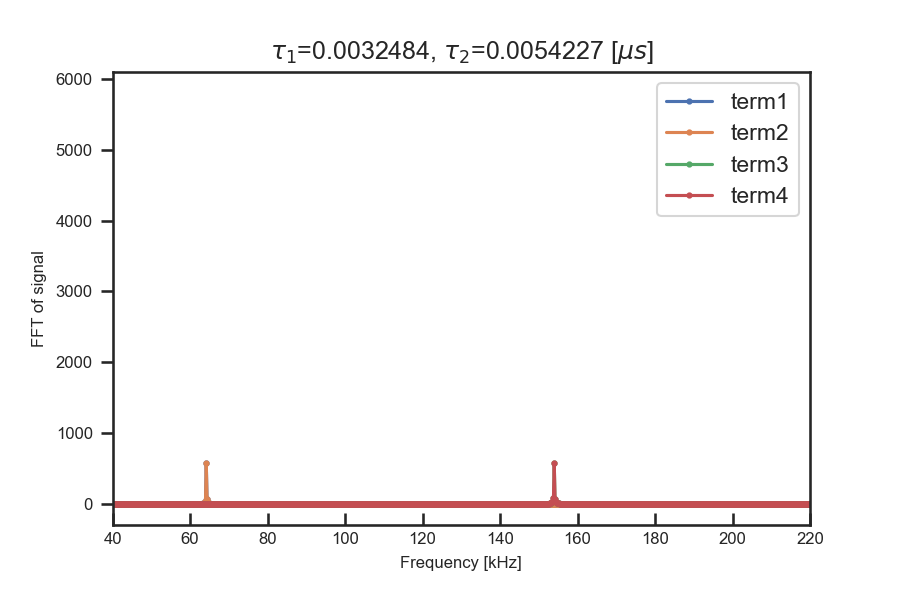

<IPython.core.display.Javascript object>


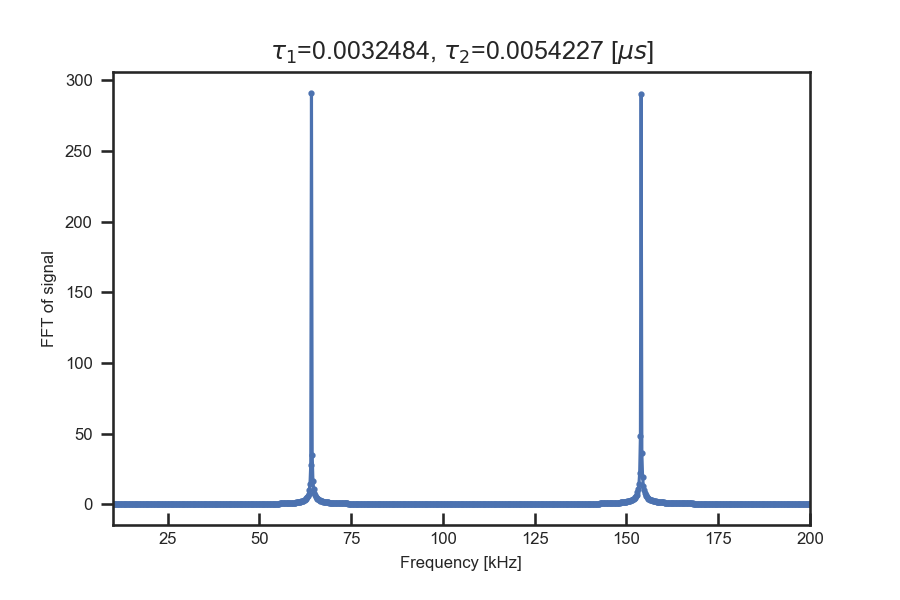

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4127076567.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


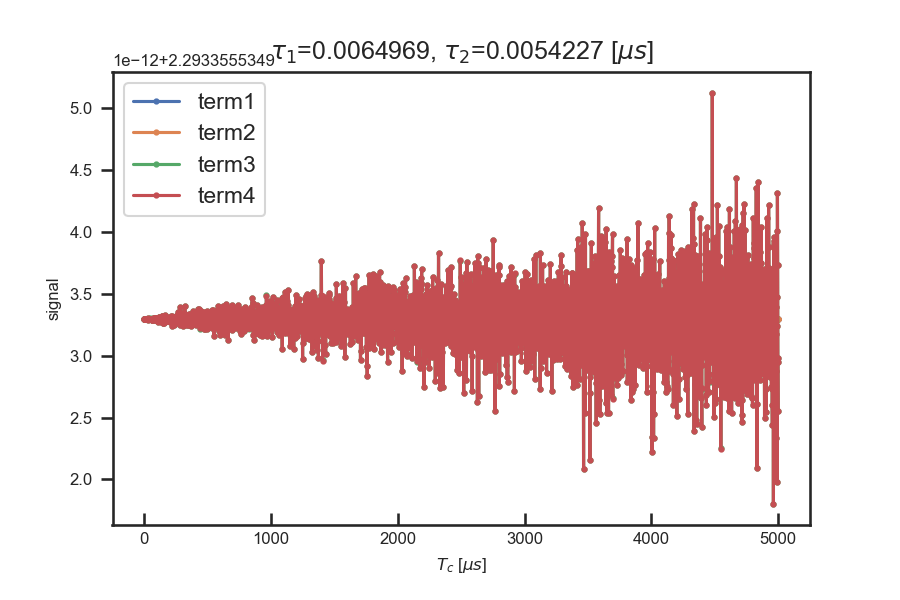

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


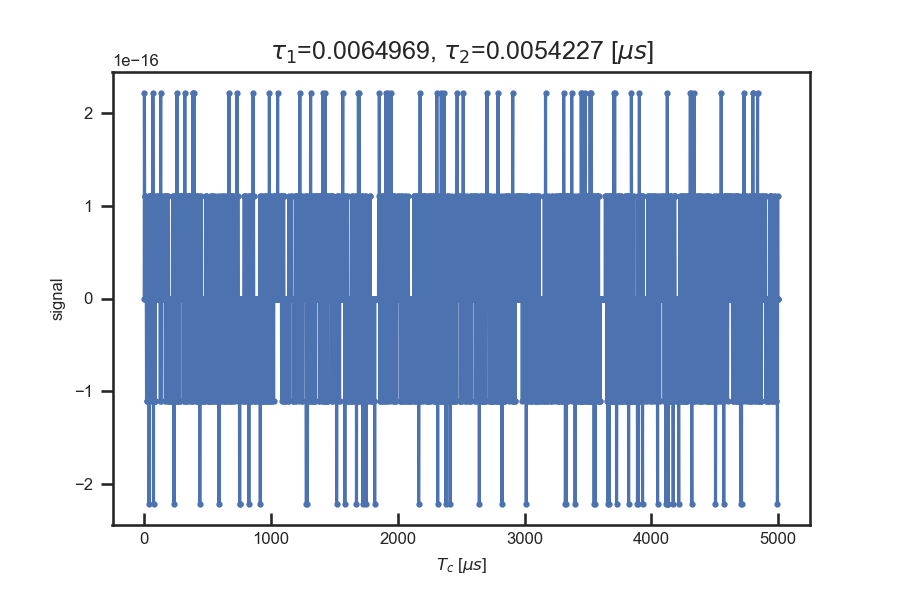

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


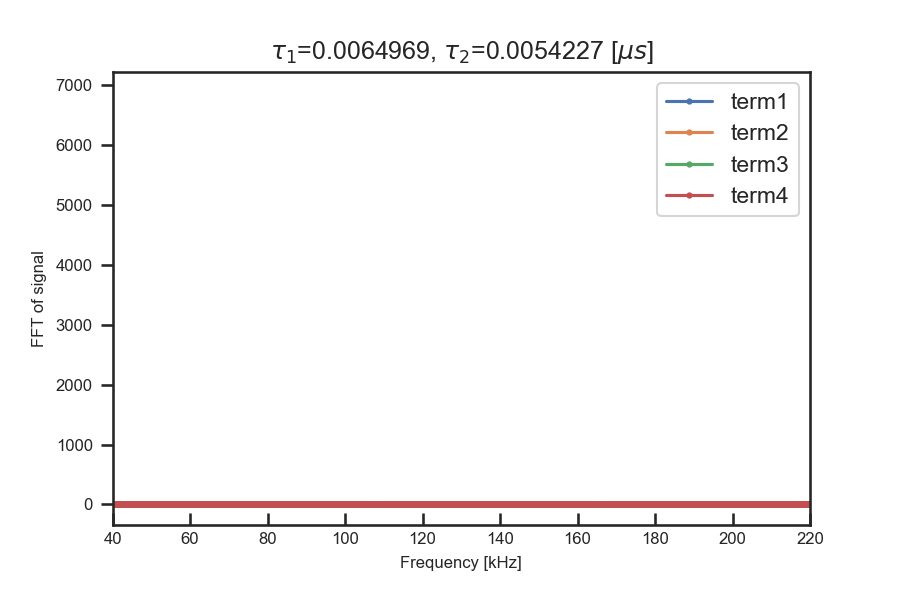

<IPython.core.display.Javascript object>


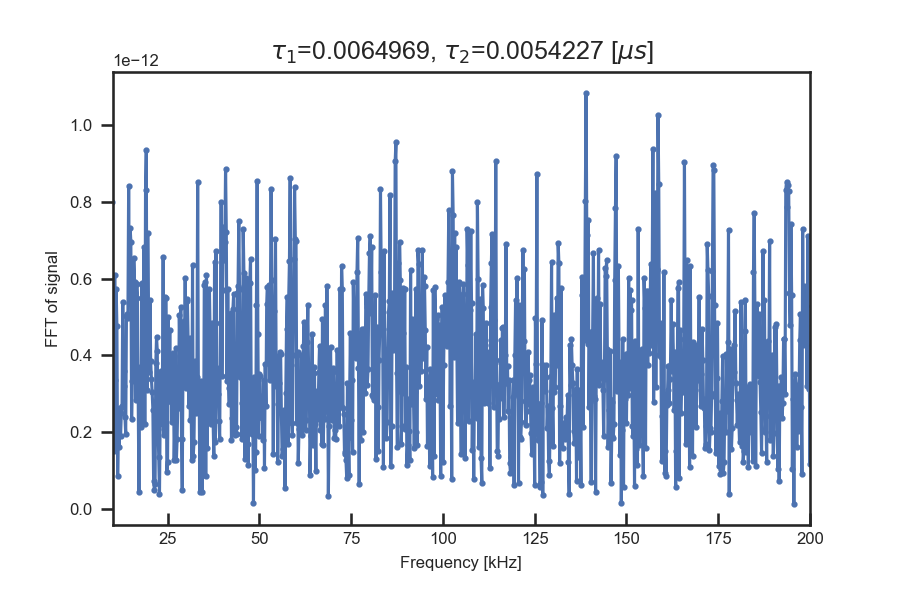

In [44]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

for tau1, tau2 in [[0.25*BS_up[0],0.25*BS_up[1]],[0.5*BS_up[0],0.5*BS_up[1]], [BS_up[0],0.5*BS_up[1]],
                   [0.5*BS_up[0],BS_up[1]], [BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(1000*Tc, term1,'-o',markersize=2, alpha = 1, label='term1')
    ax.plot(1000*Tc, term2,'-o',markersize=2, alpha = 1, label='term2')
    ax.plot(1000*Tc, term3,'-o',markersize=2, alpha = 1, label='term3')
    ax.plot(1000*Tc, term4,'-o',markersize=2, alpha = 1, label='term4')
    ax.set_xlabel(r'$T_c$ [$\mu s$]')
    ax.set_ylabel(r'signal')
    ax.legend()
    
    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(1000*Tc, signal,'-o',markersize=2, alpha = 1)
    ax.set_xlabel(r'$T_c$ [$\mu s$]')
    ax.set_ylabel(r'signal')
    
    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term1))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term1")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term2))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term2")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term3))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term3")
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(term4))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="term4")
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    ax.set_xlim(left=40, right=220)
    ax.legend()

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1,
           label="signal")
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    ax.set_xlim(left=10,right=200)

# Three nuclear spins (Two strong + one weak)


In [95]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204, 51.5, 2]) # kHz
Azx = np.array([64.4, 143.6, 1]) # kHz
Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2. ] kHz
Azx=[ 64.4 143.6   1. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402] ms


Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2. ] kHz
Azx=[ 64.4 143.6   1. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402] ms


<IPython.core.display.Javascript object>


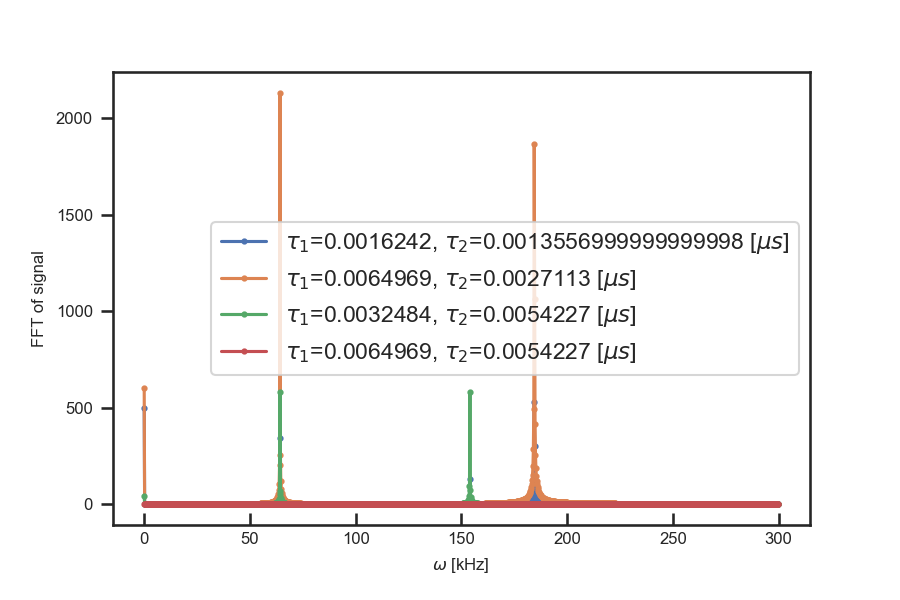

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


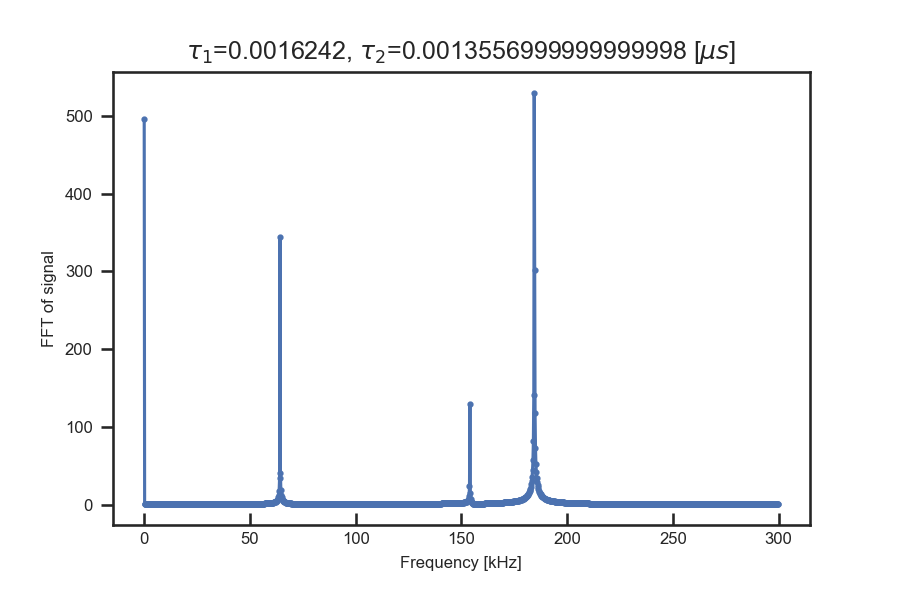

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


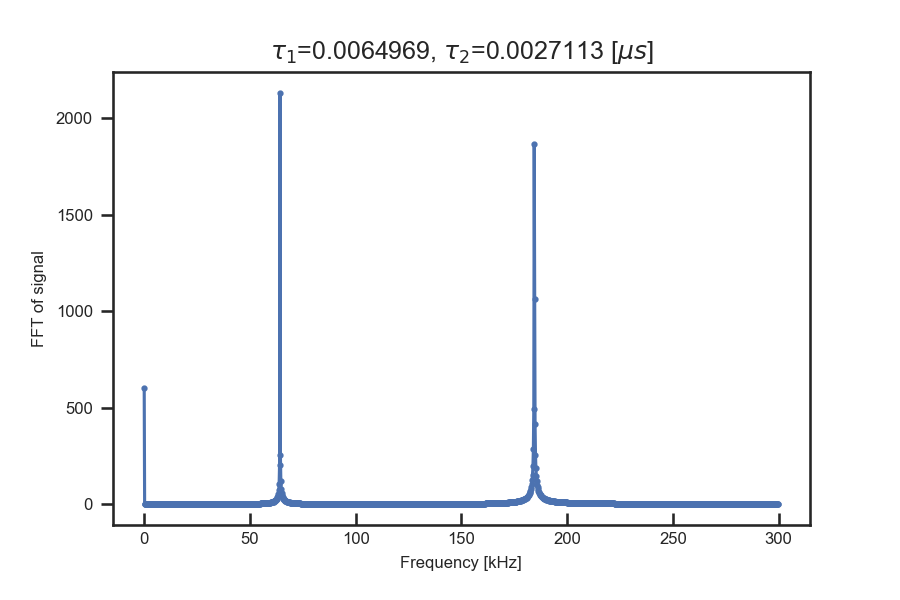

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


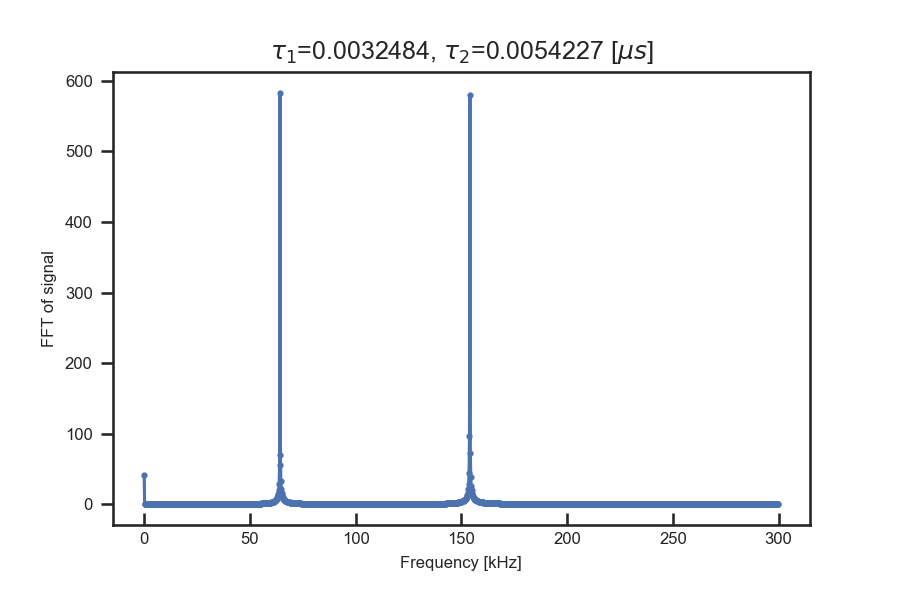

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


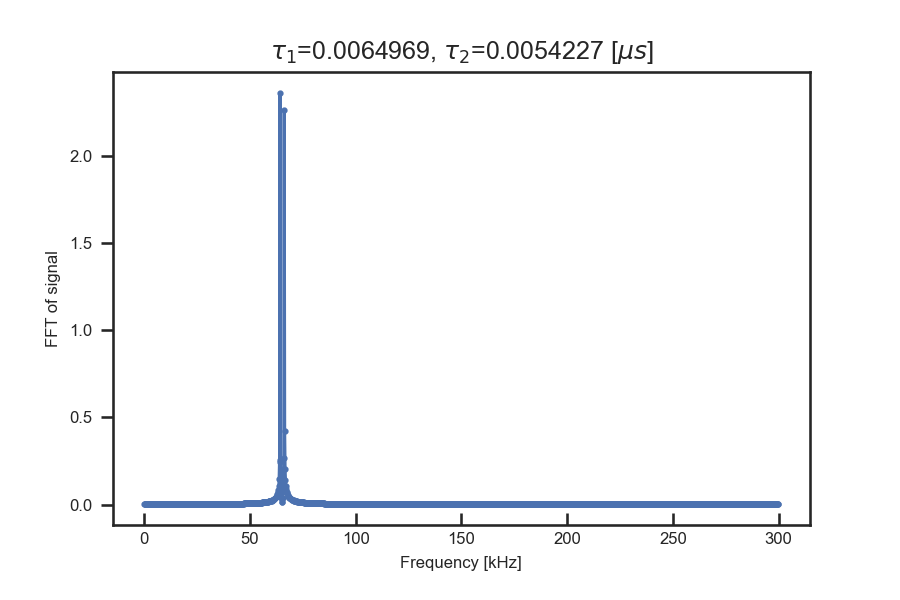

In [46]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[0.25*BS_up[0],0.25*BS_up[1]], [BS_up[0],0.5*BS_up[1]], [0.5*BS_up[0],BS_up[1]], [BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

what happens if I go to higher order blind spots?
Be careful. Higher order blind spots may blind weaker nucleis.

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2. ] kHz
Azx=[ 64.4 143.6   1. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402] ms


<IPython.core.display.Javascript object>


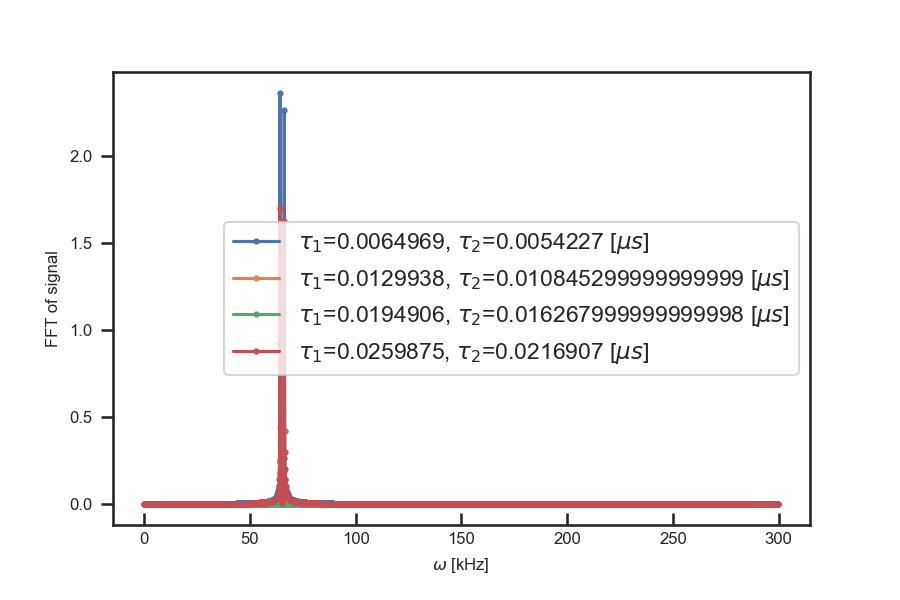

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


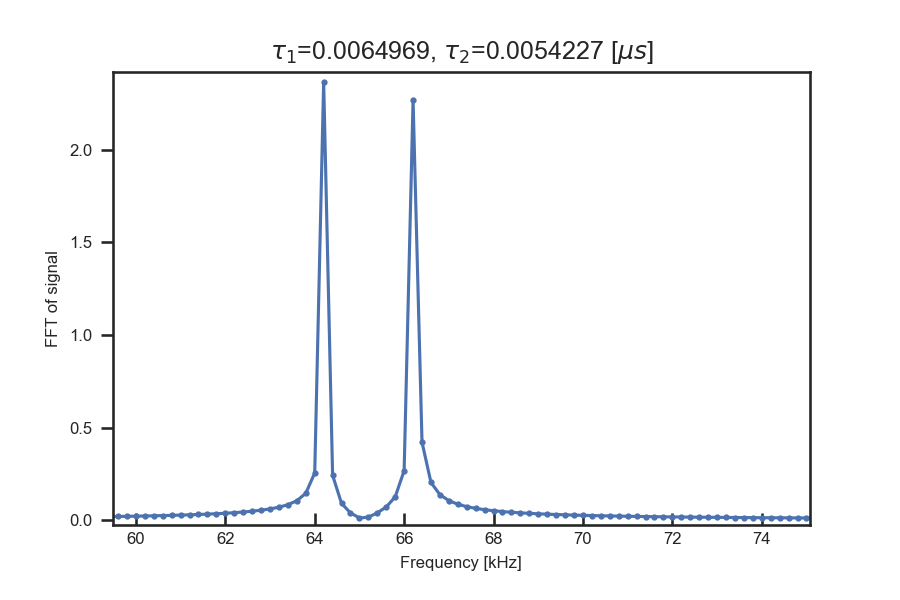

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


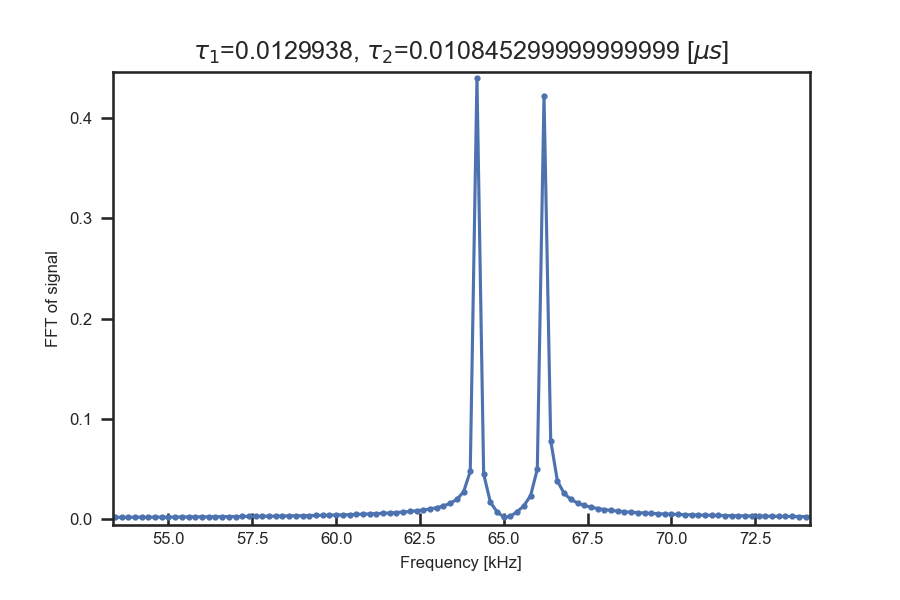

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


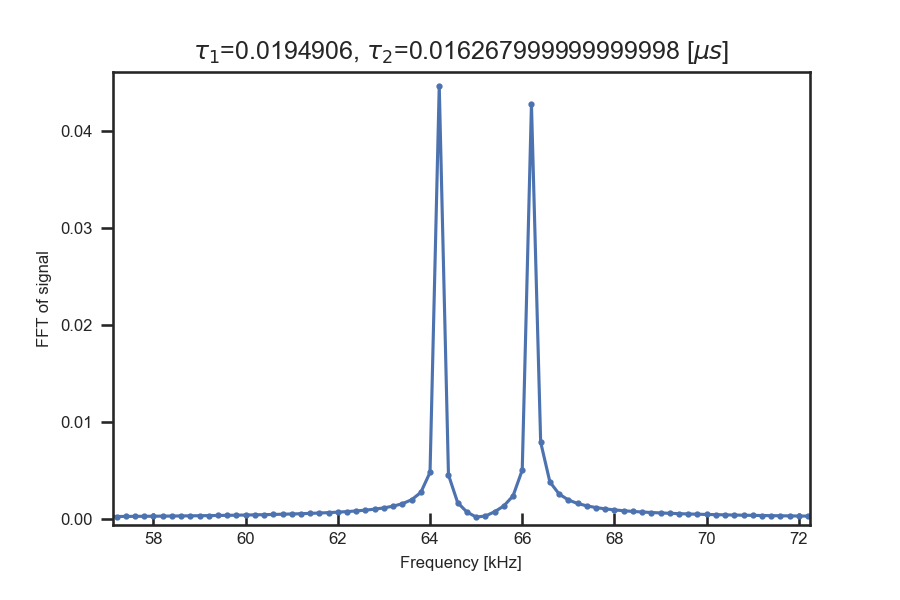

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


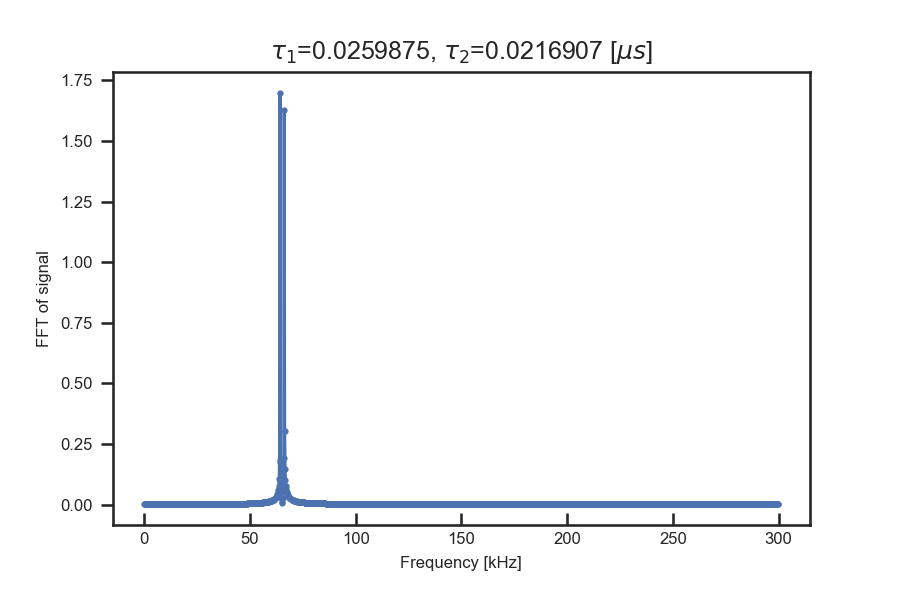

In [47]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[BS_up[0],BS_up[1]], [2*BS_up[0],2*BS_up[1]], [3*BS_up[0],3*BS_up[1]], [4*BS_up[0],4*BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

What if we apply more pi  pulses in the first blind spots?

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2. ] kHz
Azx=[ 64.4 143.6   1. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402] ms


<IPython.core.display.Javascript object>


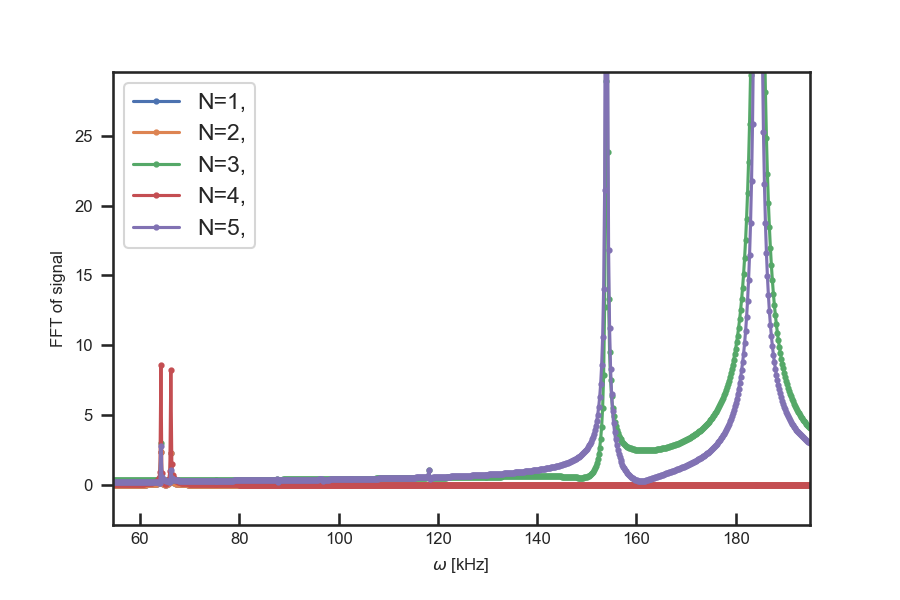

C:\Users\User\AppData\Local\Temp/ipykernel_26692/787813086.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


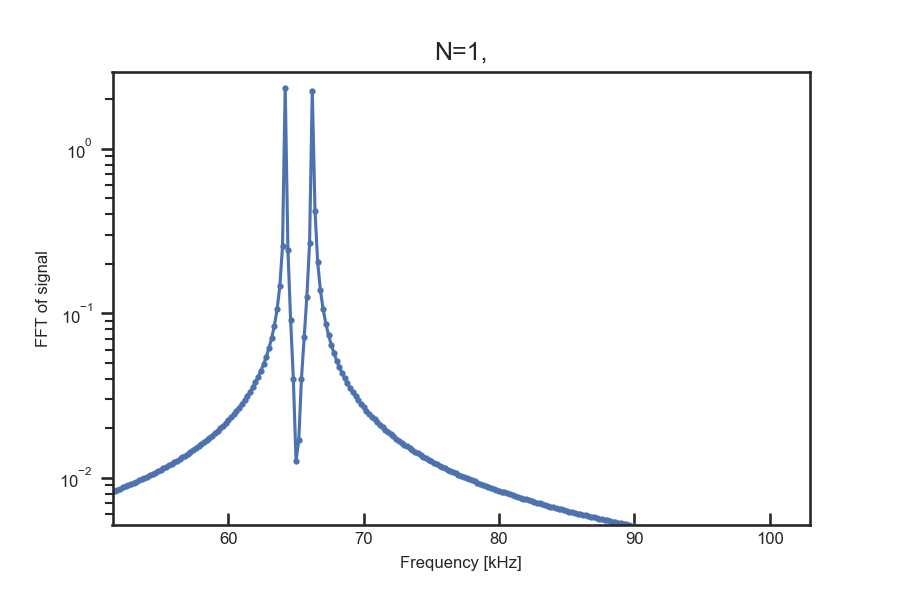

C:\Users\User\AppData\Local\Temp/ipykernel_26692/787813086.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


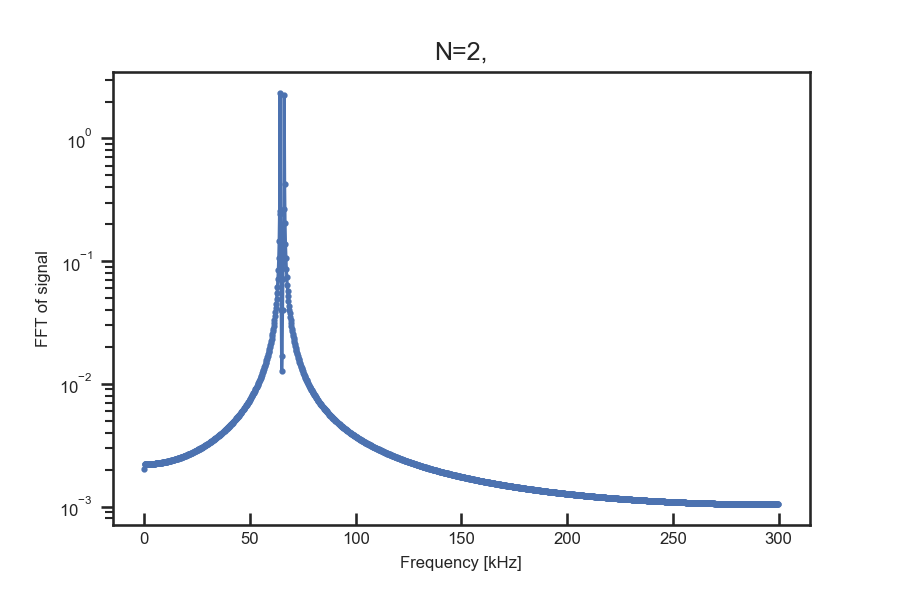

C:\Users\User\AppData\Local\Temp/ipykernel_26692/787813086.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


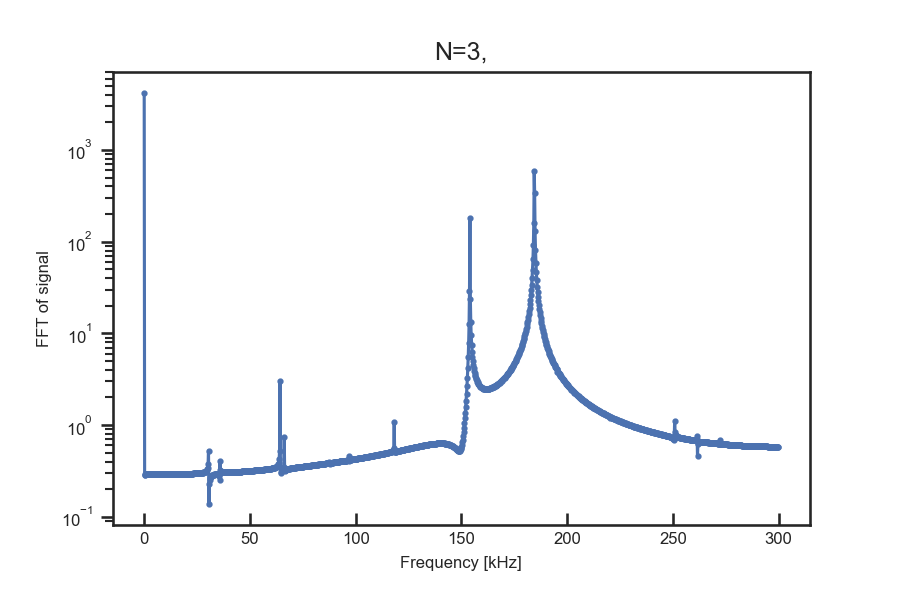

C:\Users\User\AppData\Local\Temp/ipykernel_26692/787813086.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


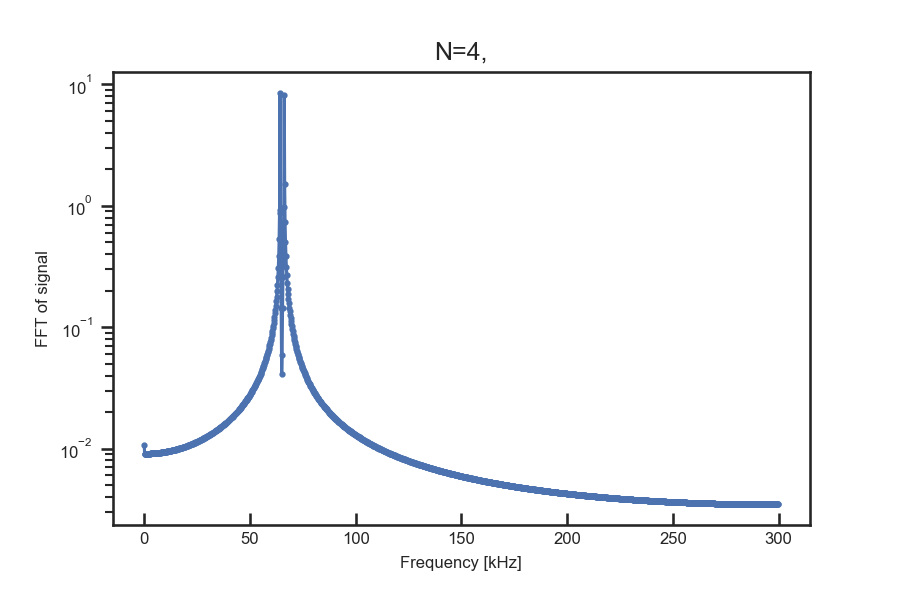

C:\Users\User\AppData\Local\Temp/ipykernel_26692/787813086.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


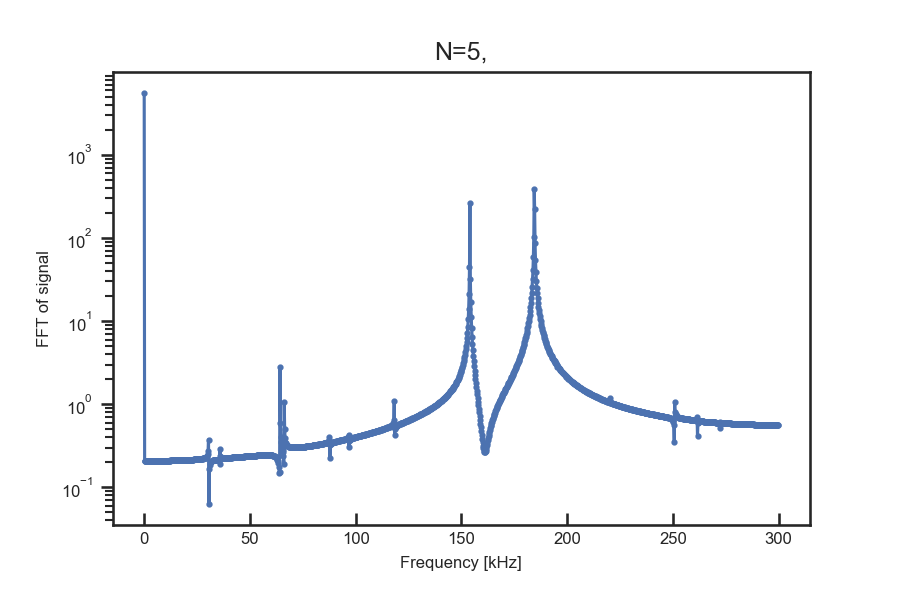

In [97]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
tau1, tau2 = BS_up[0],BS_up[1]
for n in [1,2,3,4,5]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc, N=n)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(label='N={},'.format(n))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label='N={},'.format(n) )
    ax.set_yscale('log')
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

I found the correct way of increasing the number of pulses!

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2. ] kHz
Azx=[ 64.4 143.6   1. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402] ms


<IPython.core.display.Javascript object>


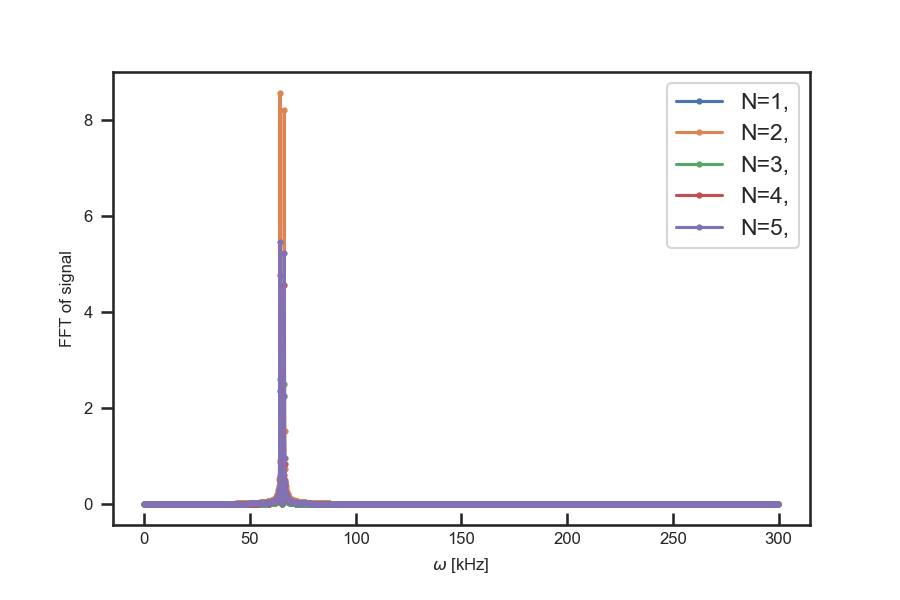

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


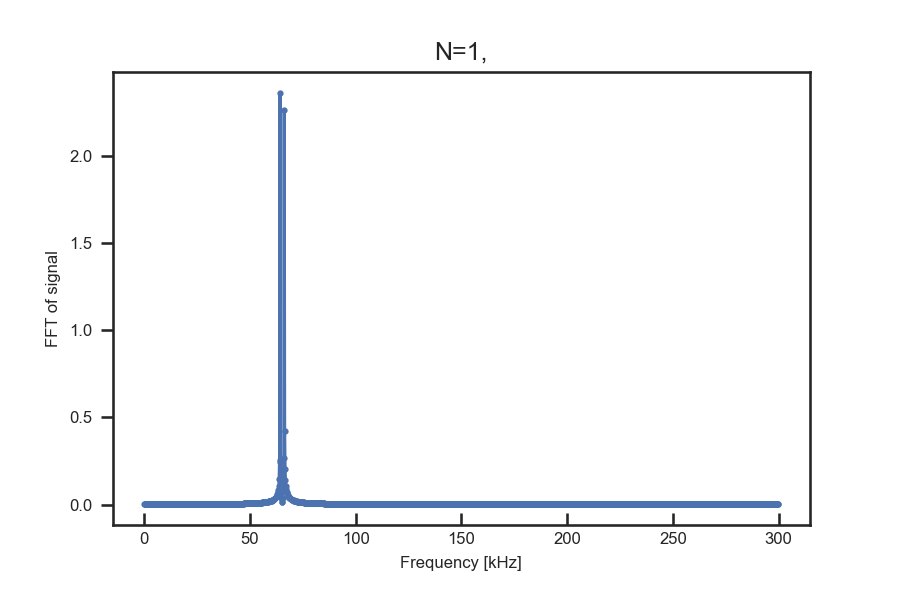

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


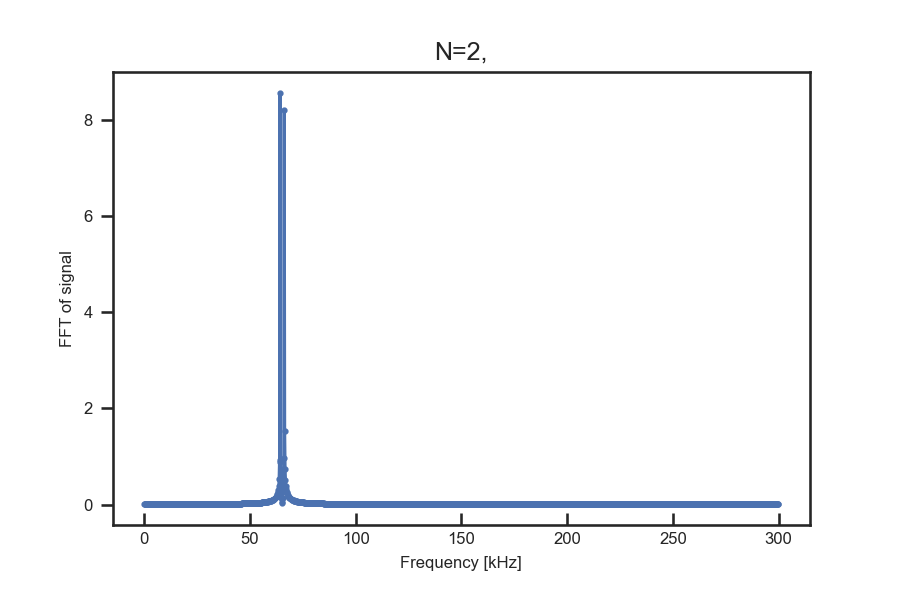

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


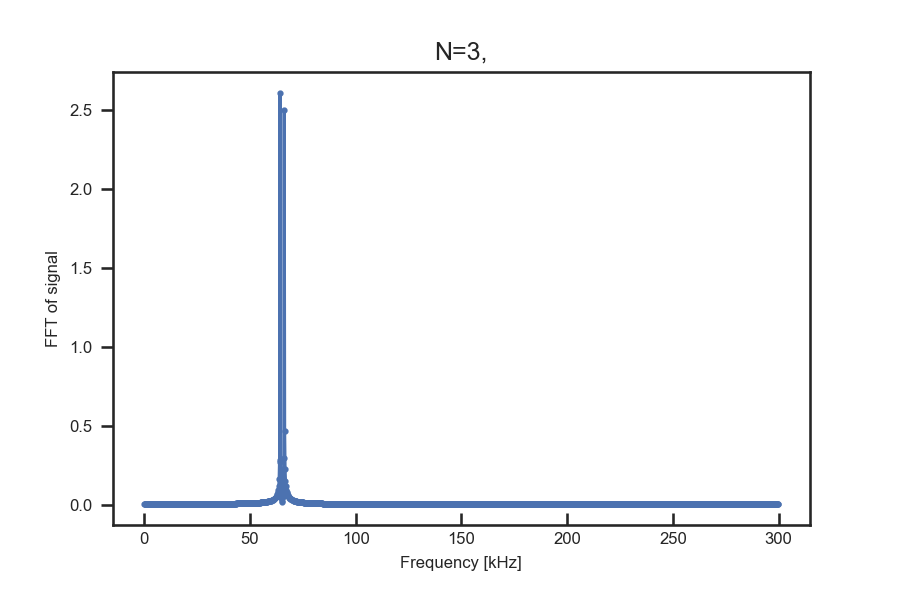

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


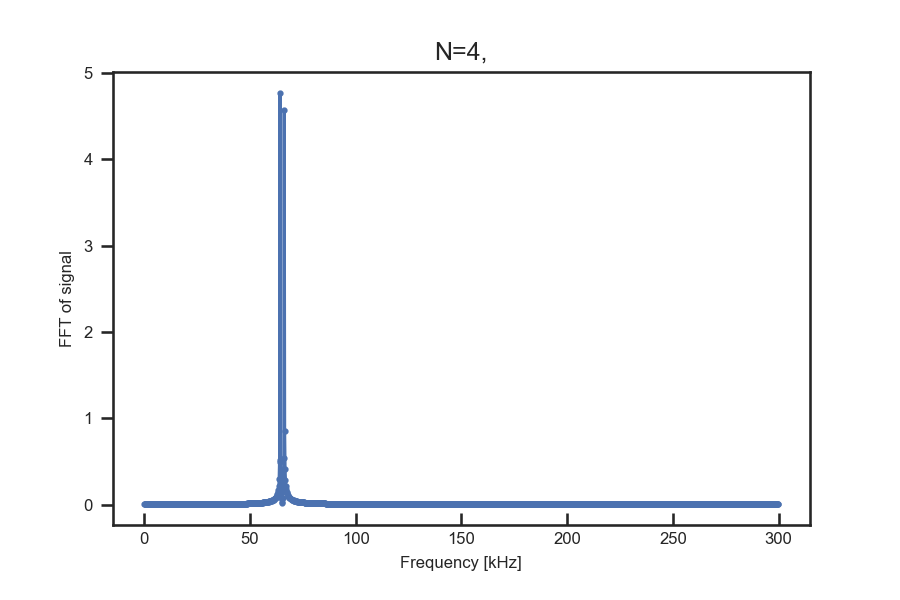

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


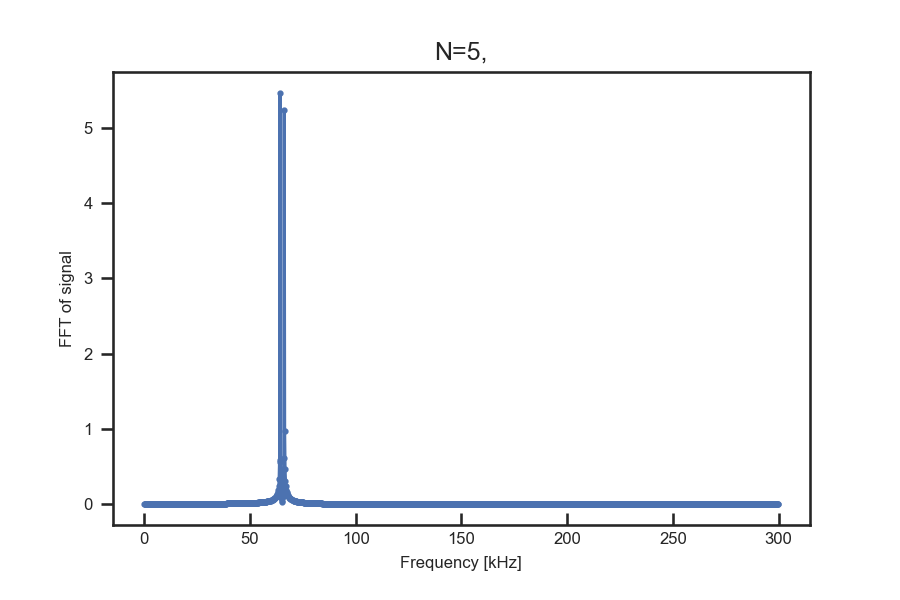

In [54]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
tau1, tau2 = BS_up[0],BS_up[1]
for n in [1,2,3,4,5]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= pulses(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc, N=n)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(label='N={},'.format(n))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label='N={},'.format(n) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

# 4 nuclei (2 strong + 2 weak)

In [55]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204, 51.5, 2, 5]) # kHz
Azx = np.array([64.4, 143.6, 1, 7]) # kHz
Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


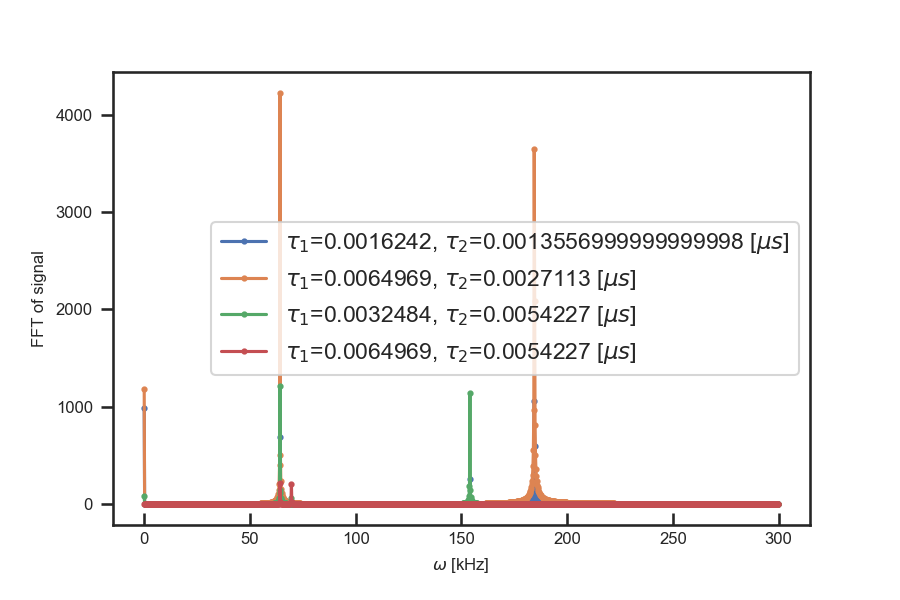

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


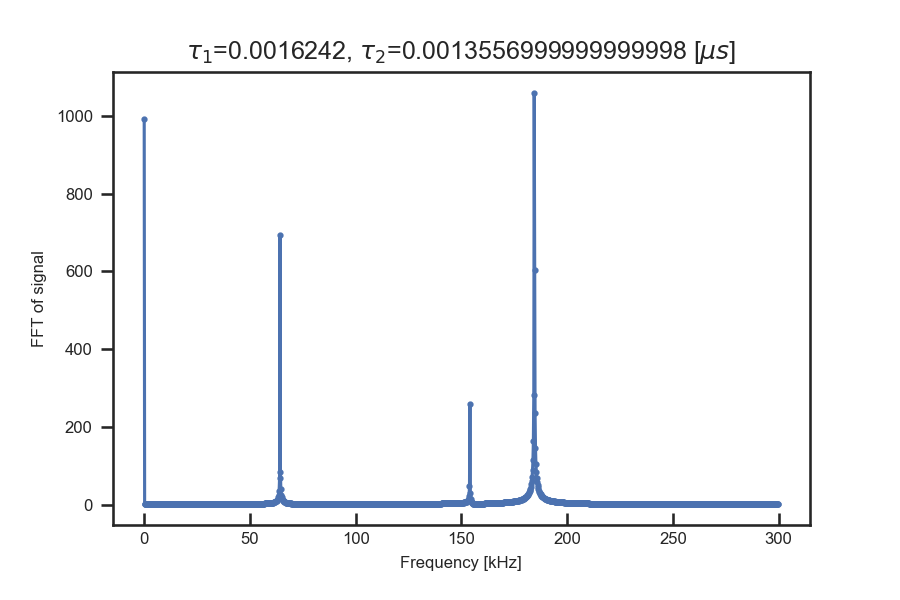

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


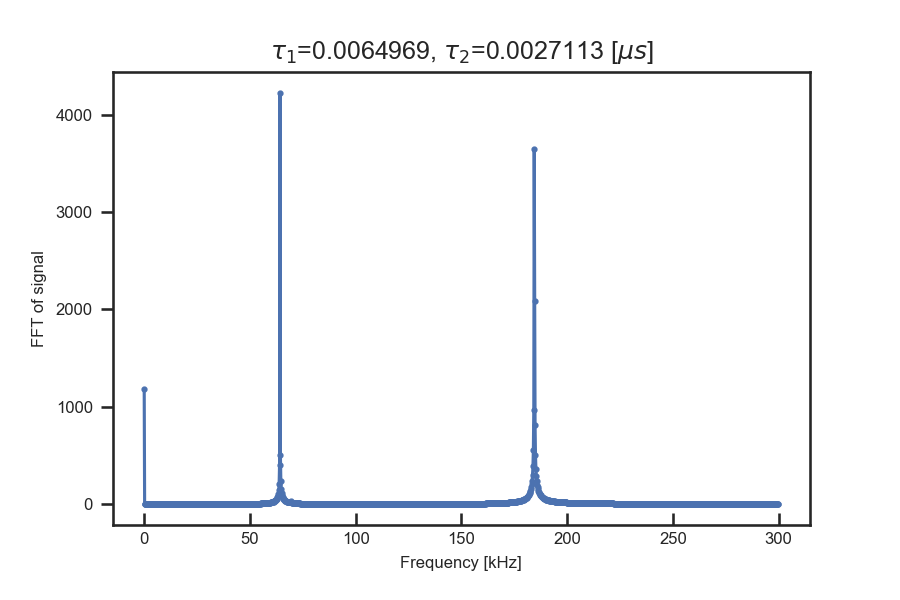

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


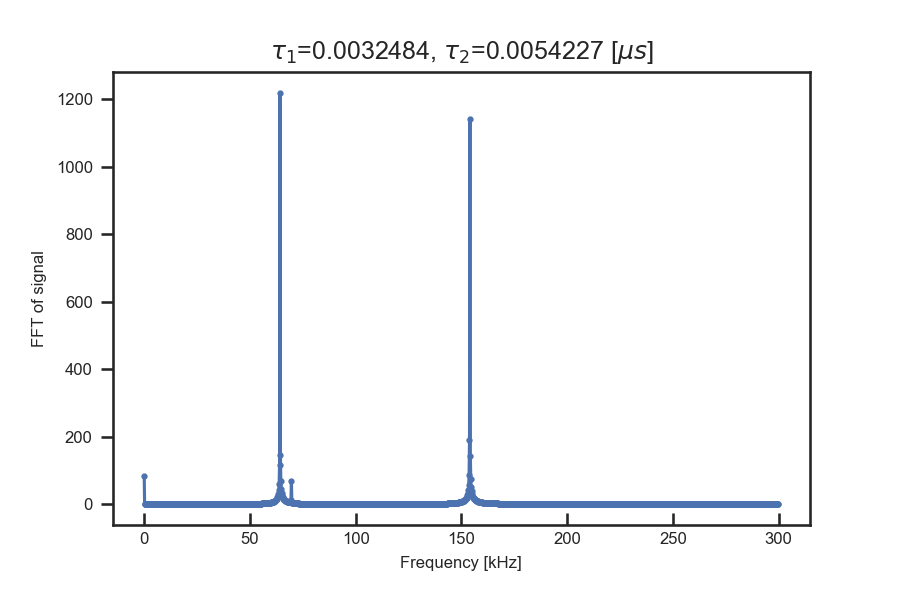

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3252998861.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


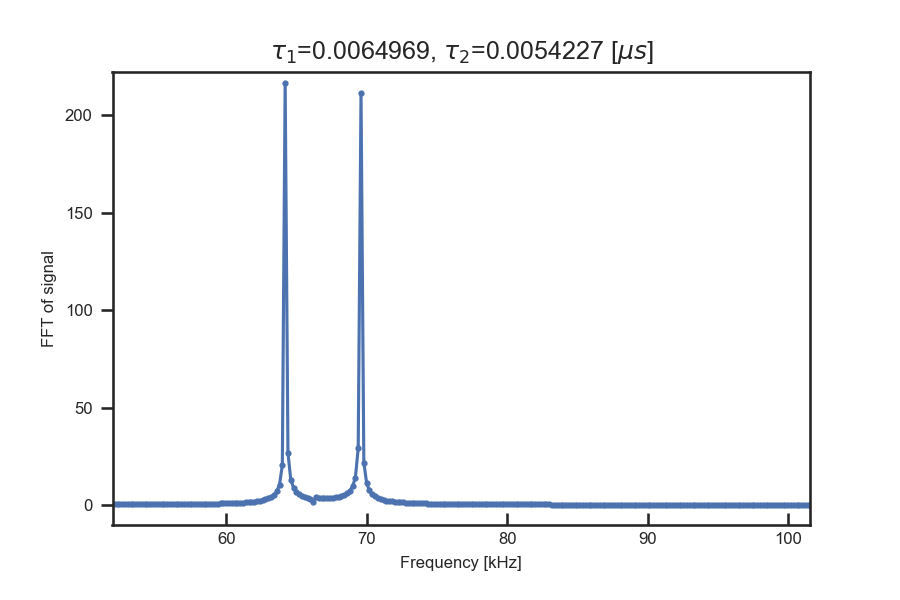

In [56]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[0.25*BS_up[0],0.25*BS_up[1]], [BS_up[0],0.5*BS_up[1]], [0.5*BS_up[0],BS_up[1]], [BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

Does it help if we go to higher order blind spots?

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


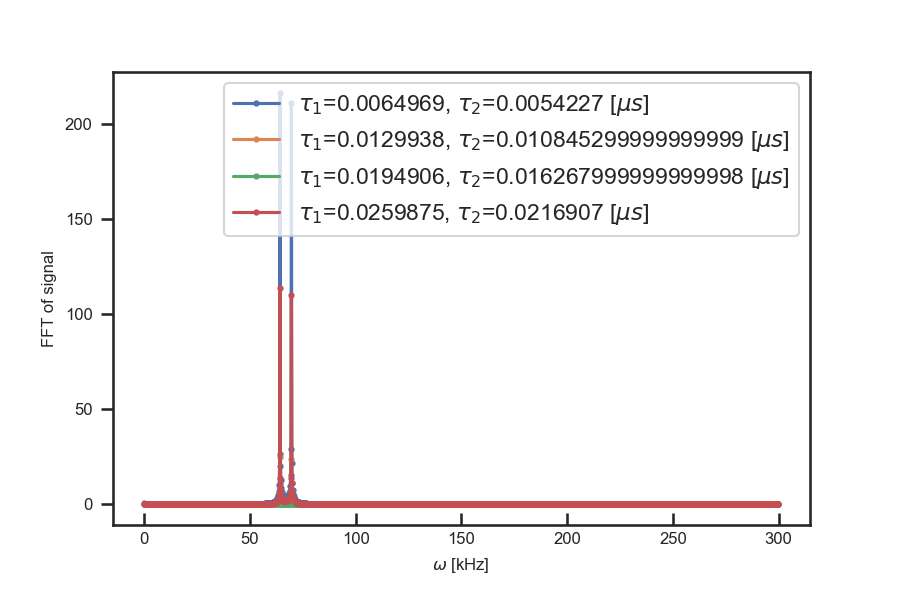

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


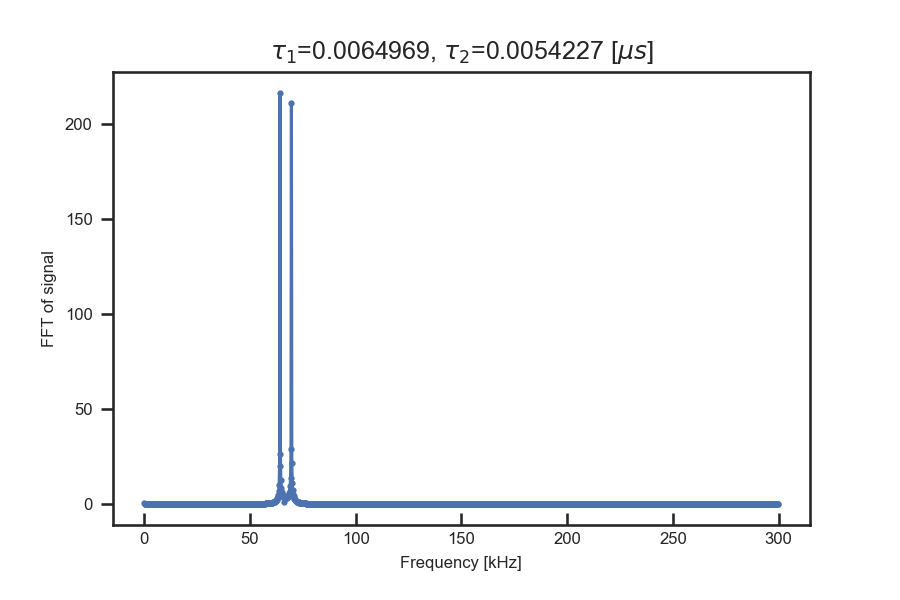

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


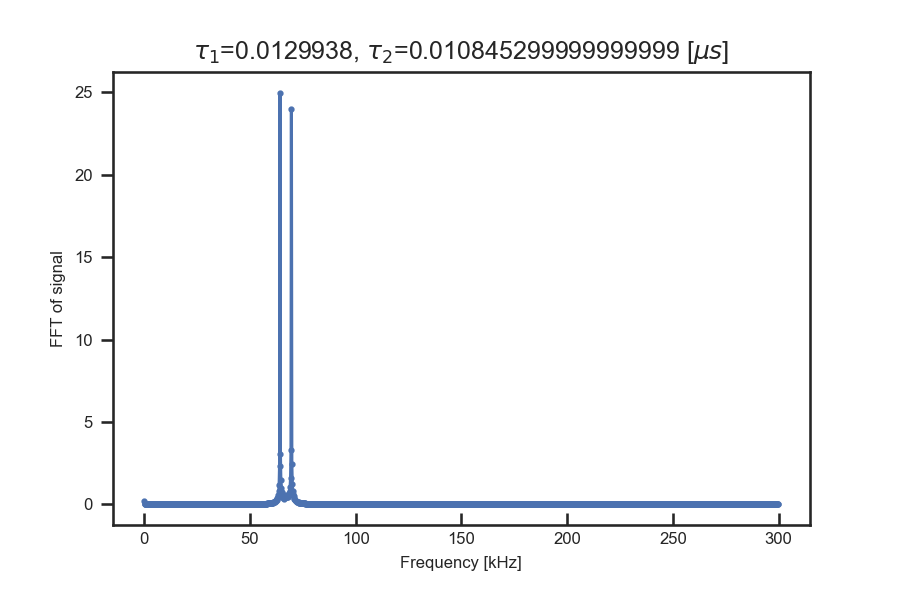

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


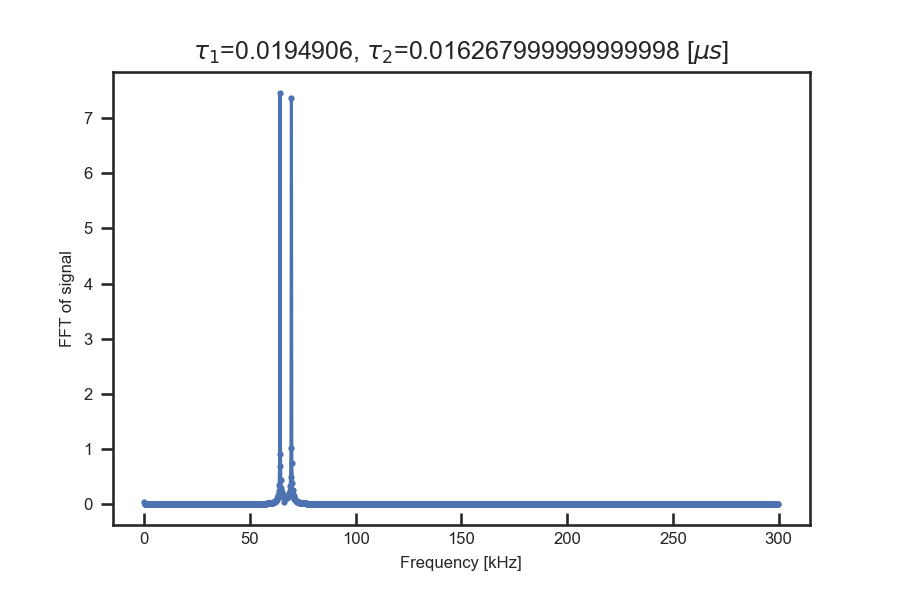

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1984332716.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


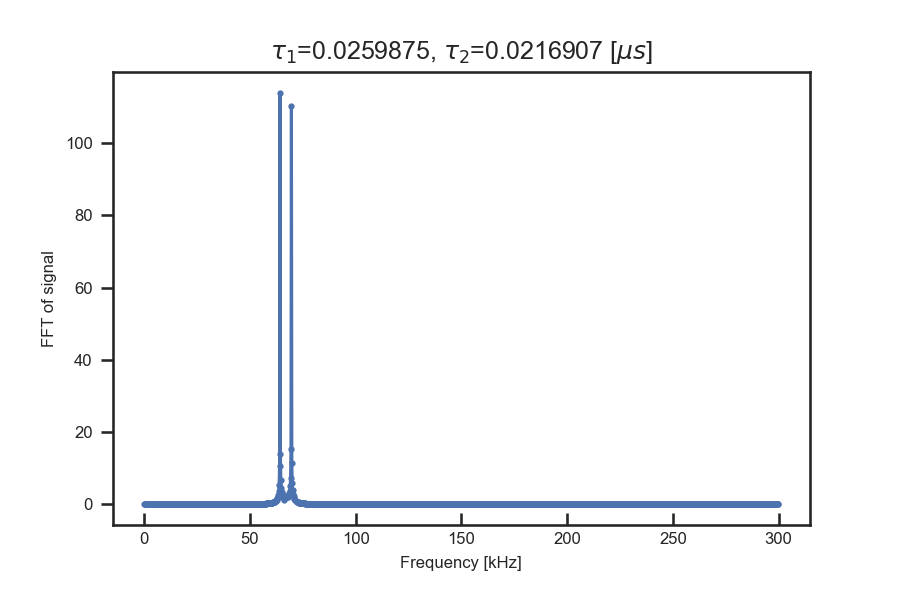

In [64]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[BS_up[0],BS_up[1]], [2*BS_up[0],2*BS_up[1]], [3*BS_up[0],3*BS_up[1]], [4*BS_up[0],4*BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

Does it help if we go to higher number of pi pulses?

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


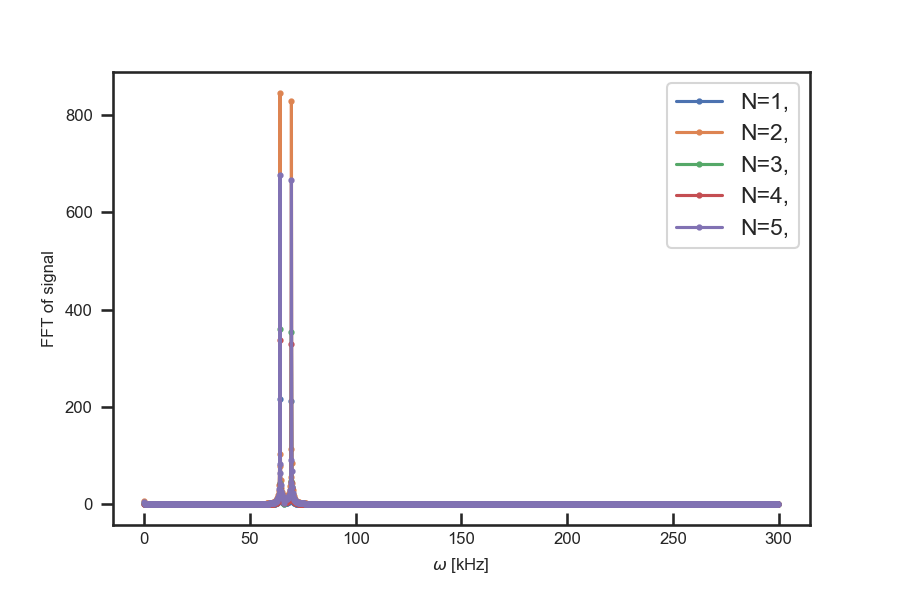

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


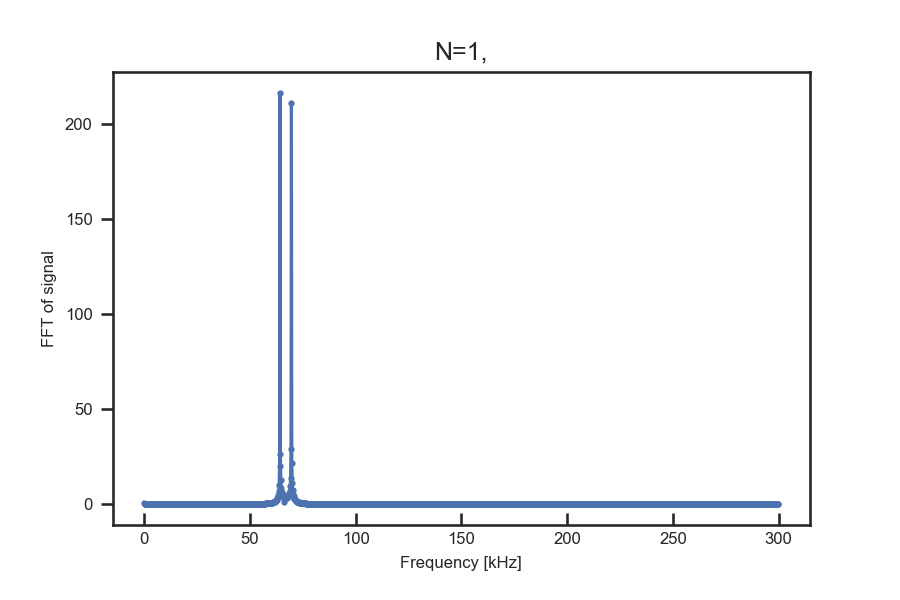

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


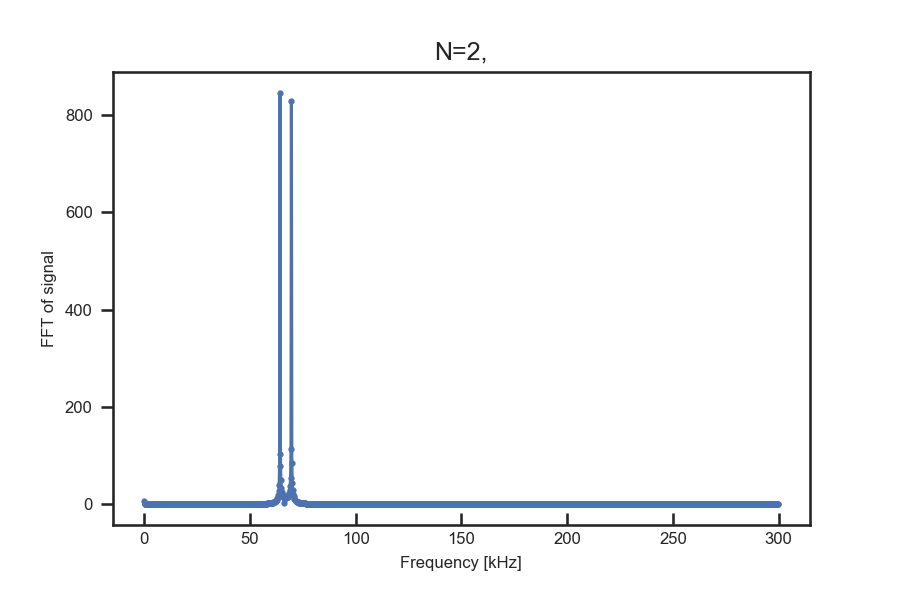

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


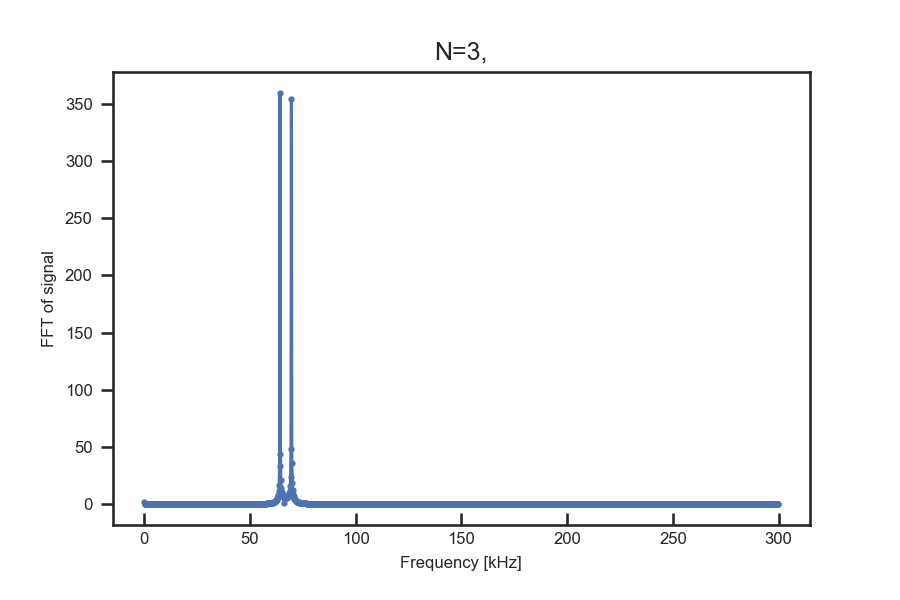

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


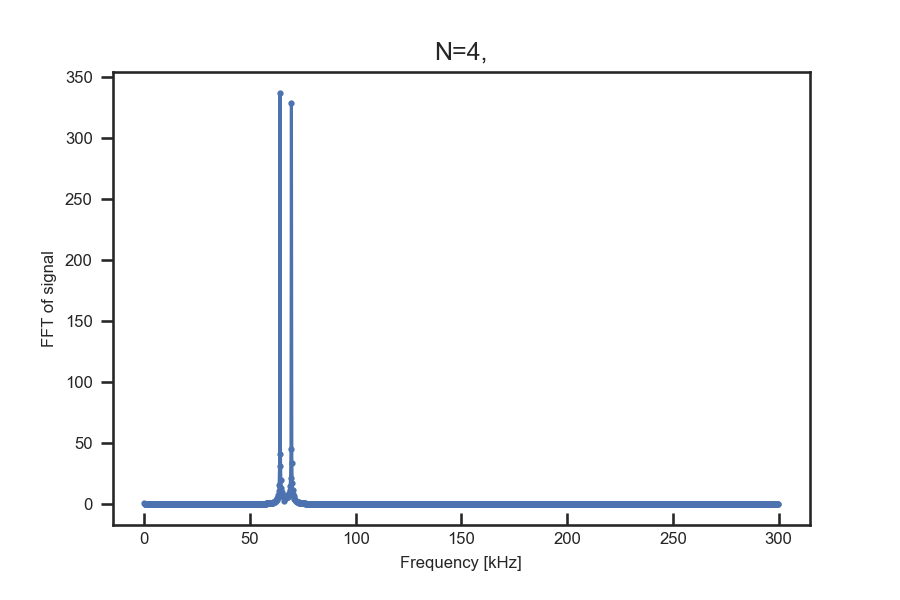

C:\Users\User\AppData\Local\Temp/ipykernel_26692/3387193243.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


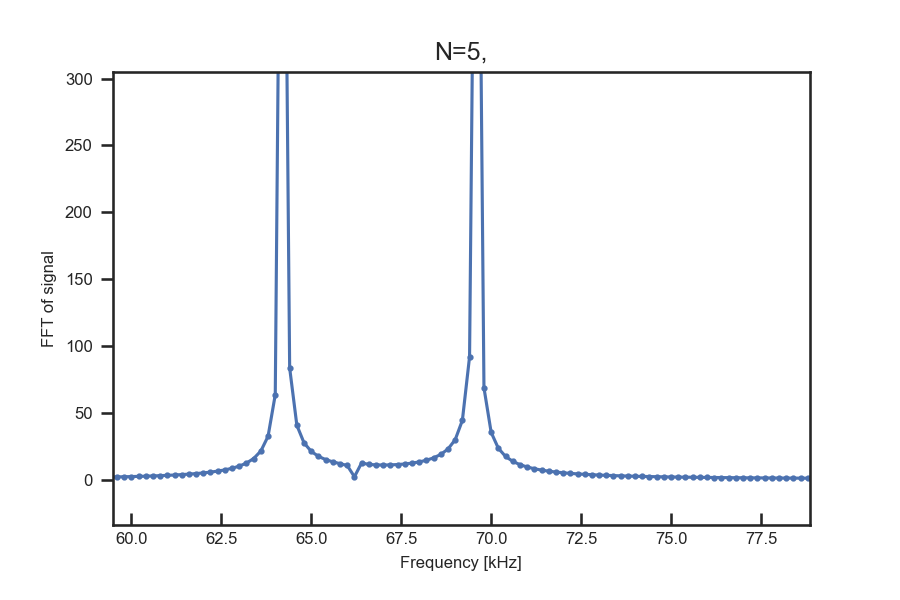

In [65]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
tau1, tau2 = BS_up[0],BS_up[1]
for n in [1,2,3,4,5]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= pulses(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc, N=n)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(label='N={},'.format(n))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label='N={},'.format(n) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

What is the tau value that brings both nuclear spins to blind spots? Just be careful this value does not blind any weak

<IPython.core.display.Javascript object>


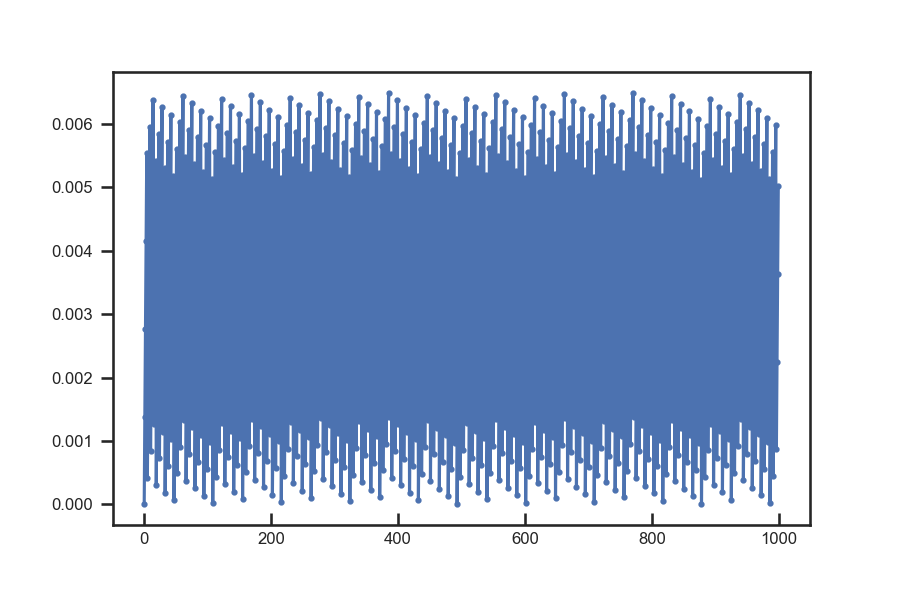

114.00888974471412

In [74]:
integers = np.arange(1000)
residual =[]
for i in integers:
    residual.append((BS_up[3]*i)%BS_up[0])

fig,ax = plt.subplots(dpi=150)
ax.plot(integers, residual,'-o',markersize=2, alpha = 1)
(BS_up[3]*43)/BS_up[1]

Can we consider one two for blinding both strong spins and another tau to focus on a weak?

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


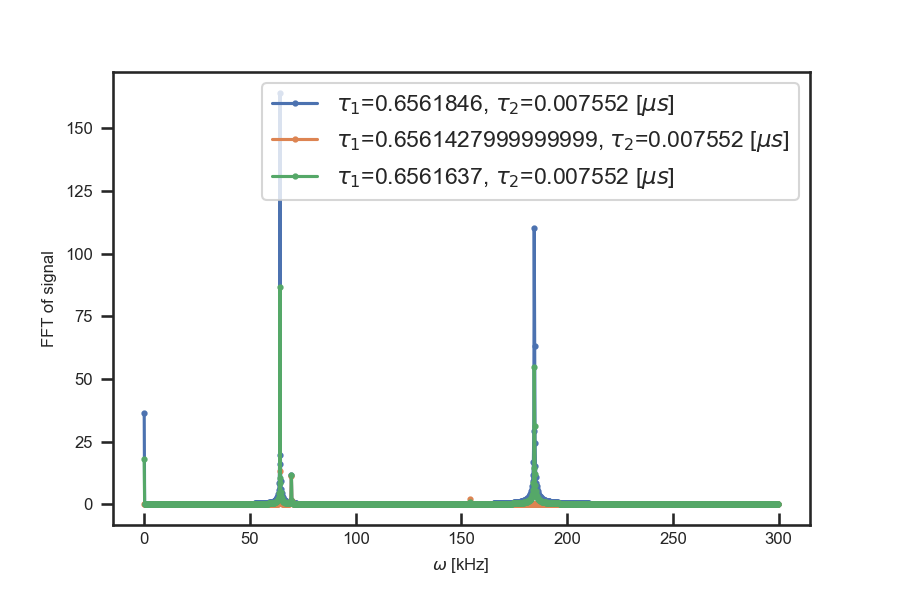

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4294336379.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


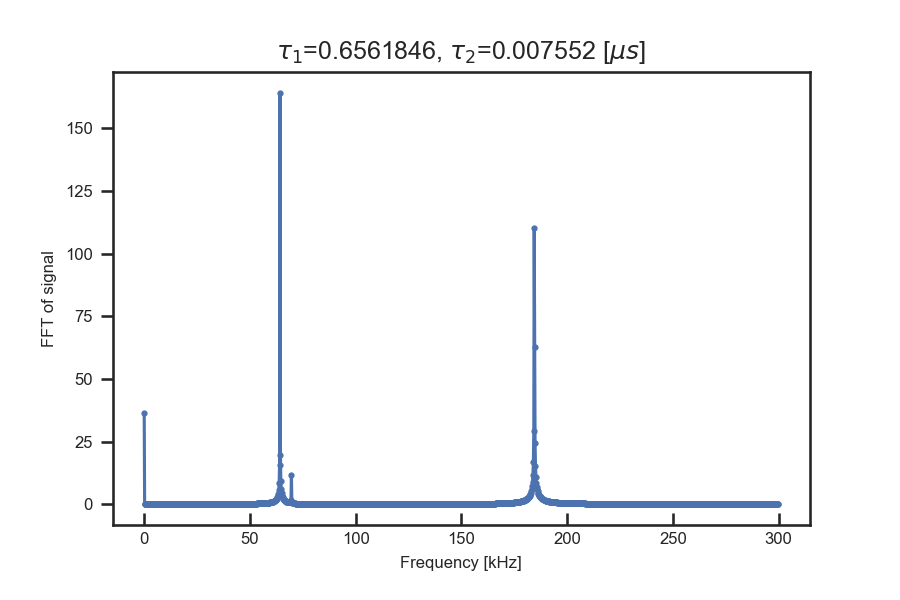

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4294336379.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


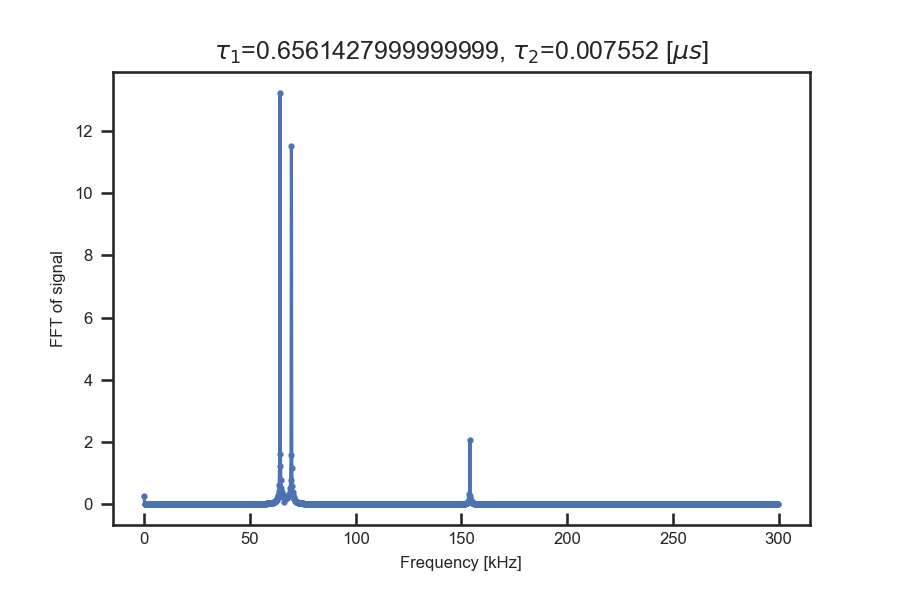

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4294336379.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


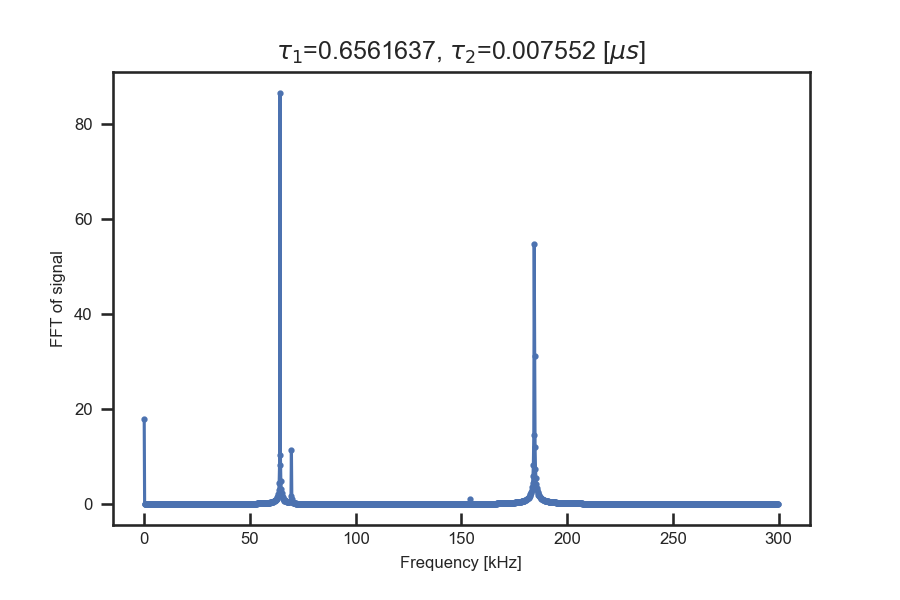

In [66]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[101*BS_up[0], 0.5*BS_up[2]],[121*BS_up[1], 0.5*BS_up[2]],[(121*BS_up[1]+101*BS_up[0])/2, 0.5*BS_up[2]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

Using differernt tricks to resolve the peak close to larmor
I tried to blind three peaks and it kind of worked

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


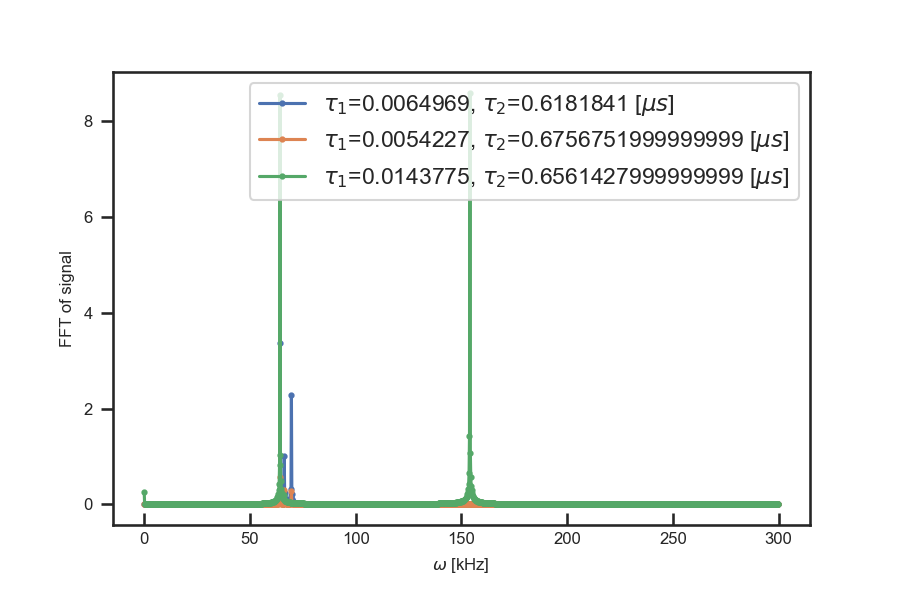

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4201106042.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


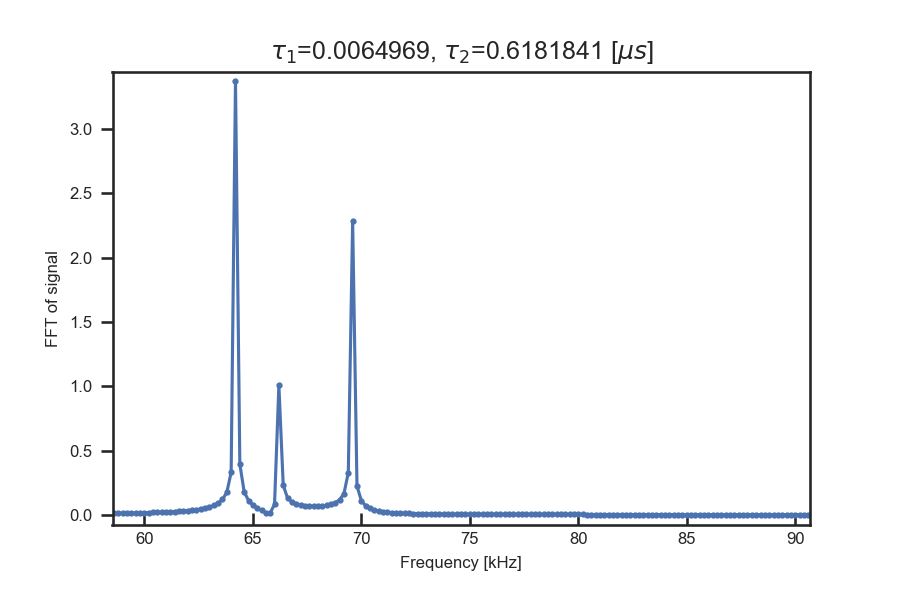

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4201106042.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


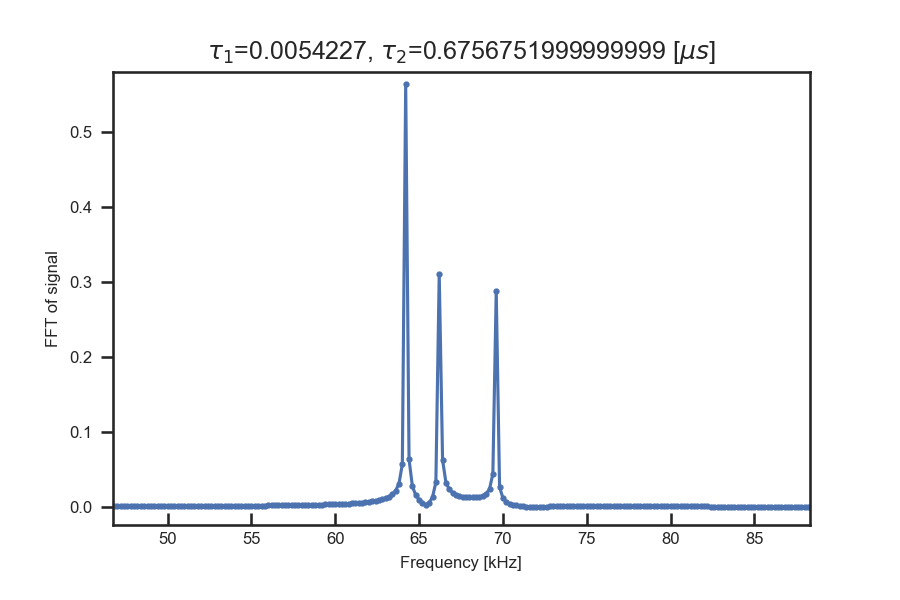

C:\Users\User\AppData\Local\Temp/ipykernel_26692/4201106042.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


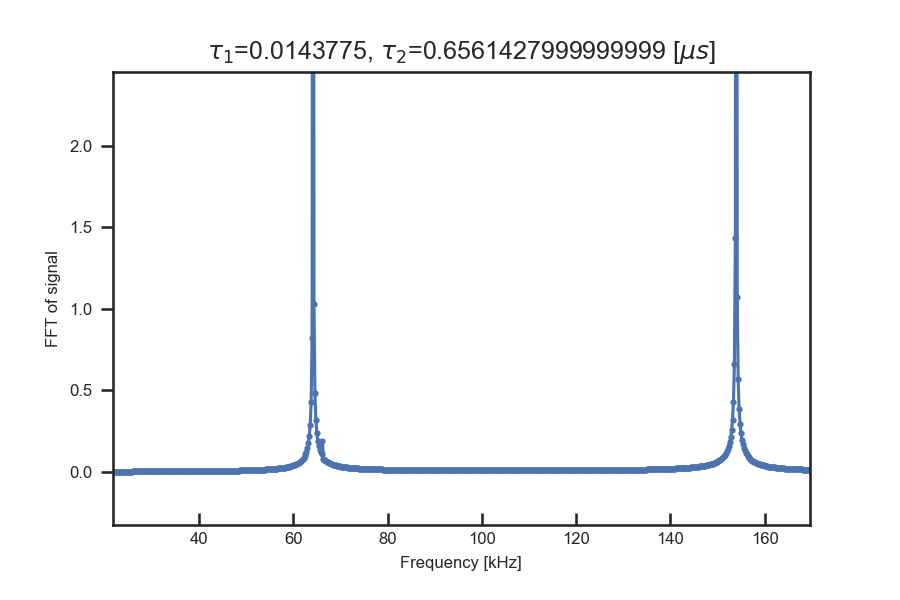

In [75]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[BS_up[0],114*BS_up[1]], [BS_up[1],104*BS_up[0]], [BS_up[3],121*BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()

How about using no trick. But run for a longer time and higher precision?

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


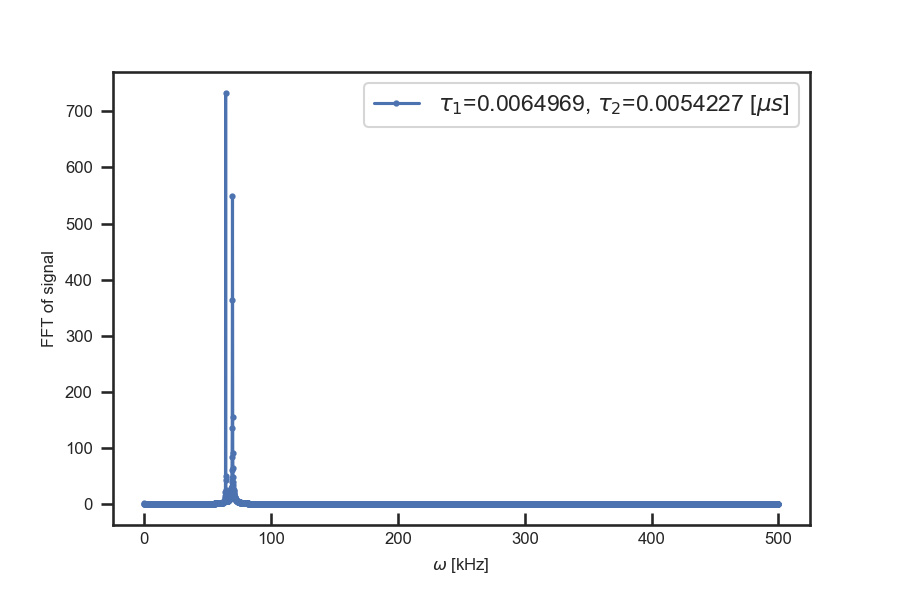

C:\Users\User\AppData\Local\Temp/ipykernel_26692/1399388225.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/10000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


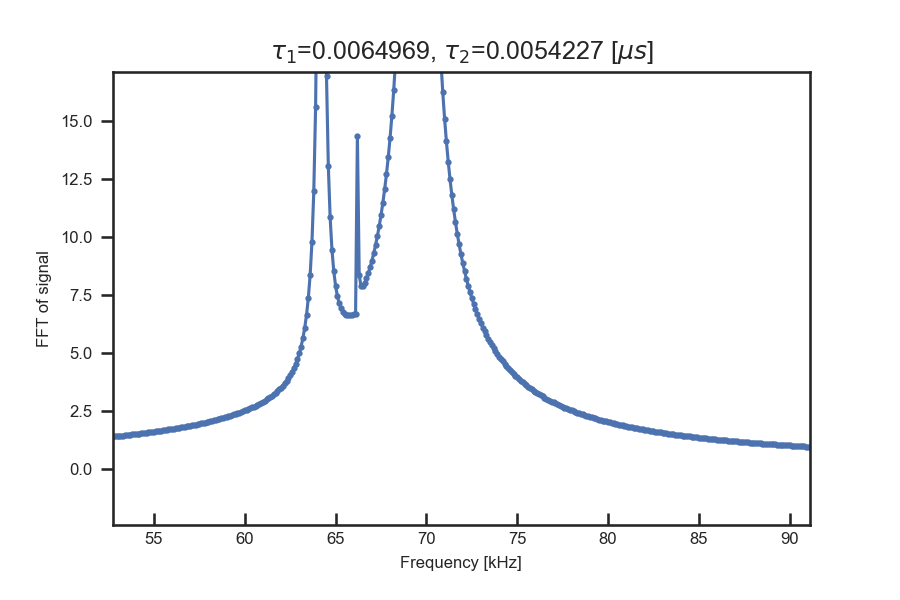

In [79]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 10 # in ms
steps = 10000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_yscale('log')
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()
ax.set_yscale('log')

# 10 nuclear spin (2 strong + 8 weak)
We blind two strong ones. Can we resolve all weaks? Apperantly yes. But if two weak are very close two each other, it won't be easy. Higher Tc better resolution!

In [81]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204, 51.5, 2, 5]) # kHz
Azx = np.array([64.4, 143.6, 1, 7]) # kHz



rand_Azz = np.random.normal(loc=0, scale=5, size=6)
rand_Azx = np.random.normal(loc=0, scale=5, size=6)
Azz = np.append(Azz, rand_Azz)
Azx = np.append(Azx, rand_Azx)

Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204.           51.5           2.            5.            1.77313365
    3.05201257    0.77325186    1.42787496    4.4699729     5.71814171] kHz
Azx=[ 64.4        143.6          1.           7.           4.41925985
   6.41558336   6.86937371  -8.21584889  -4.20161191  -6.42726374] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515  66.1209817
  67.55733051  65.33537903  66.14014019  68.79839185  70.21293513] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775  0.01512379 0.01480224
 0.01530564 0.01511941 0.01453522 0.01424239] ms


Freq Larmor=64.2 kHz
Azz=[-204.           51.5           2.            5.            1.77313365
    3.05201257    0.77325186    1.42787496    4.4699729     5.71814171] kHz
Azx=[ 64.4        143.6          1.           7.           4.41925985
   6.41558336   6.86937371  -8.21584889  -4.20161191  -6.42726374] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515  66.1209817
  67.55733051  65.33537903  66.14014019  68.79839185  70.21293513] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775  0.01512379 0.01480224
 0.01530564 0.01511941 0.01453522 0.01424239] ms


<IPython.core.display.Javascript object>


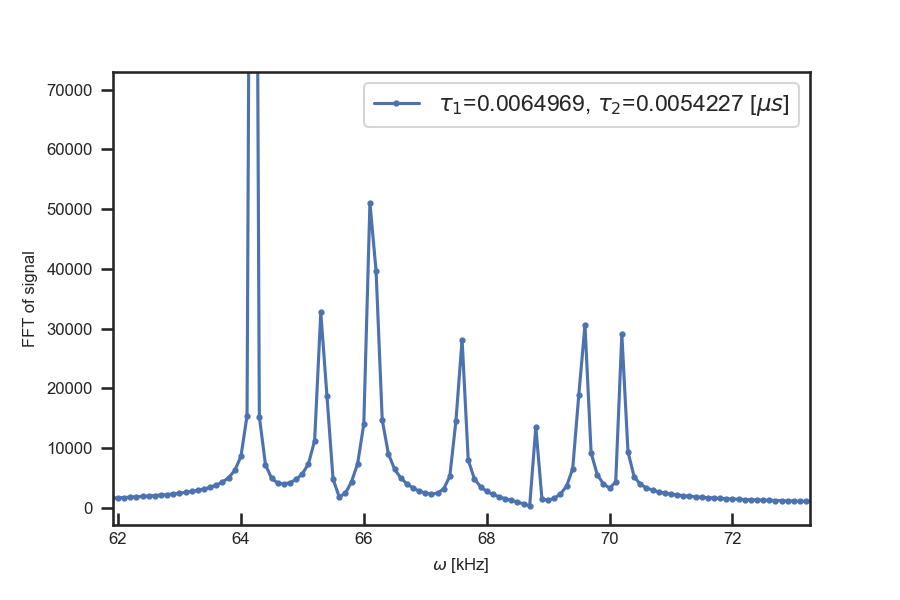

C:\Users\User\AppData\Local\Temp/ipykernel_26692/2932445566.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/10000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


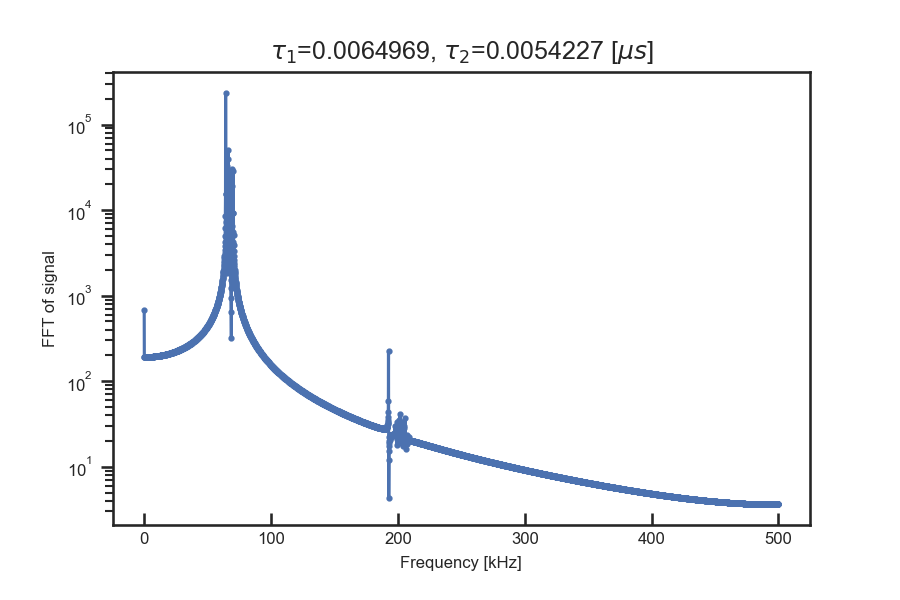

In [82]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 10 # in ms
steps = 10000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2 in [[BS_up[0],BS_up[1]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= five_pulse_ESEEM(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7))) )
    ax.set_yscale('log')
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()
ax.set_yscale('log')

# Generating new sequences!?
What kind of sequences should we try?

In [91]:
def seq1(azz, azx, tau1, tau2, tau3, Tc, N=1):
    
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    VV0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau3).expm())*((-1j*WL*Iz*tau3).expm()))**N
    VV1 = (((-1j*WL*Iz*tau3).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau3).expm()))**N
    
    V0 = VV0*V0
    V1 = VV1*V1
    
    tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
    tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
    tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
    tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
    return [tt1, tt2, tt3, tt4]

def seq2(azz, azx, tau1, tau2, tau3, Tc, N=1):
    
    U0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm())*((-1j*WL*Iz*tau1).expm()))**N
    U1 = (((-1j*WL*Iz*tau1).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau1).expm()))**N
    W0 = (-1j*WL*Iz*Tc).expm()
    W1 = (-1j*(WL*Iz+azz*Iz+azx*Ix)*Tc).expm()
    V0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm())*((-1j*WL*Iz*tau2).expm()))**N
    V1 = (((-1j*WL*Iz*tau2).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau2).expm()))**N
    UU0 = (((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau3).expm())*((-1j*WL*Iz*tau3).expm()))**N
    UU1 = (((-1j*WL*Iz*tau3).expm())*((-1j*(WL*Iz+azz*Iz+azx*Ix)*tau3).expm()))**N
    
    U0 = UU0*U0
    U1 = UU1*U1
    
    tt1 = (V1*W0*U0*(U1.dag())*(W0.dag())*(V0.dag())).tr()
    tt2 = (V0*W0*U0*(U1.dag())*(W0.dag())*(V1.dag())).tr()
    tt3 = (V1*W1*U0*(U1.dag())*(W1.dag())*(V0.dag())).tr()
    tt4 = (V0*W1*U0*(U1.dag())*(W1.dag())*(V1.dag())).tr()
    return [tt1, tt2, tt3, tt4]

In [92]:
# determining the parameters
fL = 1.07*60 # kHz
WL = 2*pi*1.07*60 # kHz
Azz = np.array([-204, 51.5, 2, 5]) # kHz
Azx = np.array([64.4, 143.6, 1, 7]) # kHz
Fh_up = np.sqrt((fL*np.ones_like(Azz,dtype=float)+Azz)**2+(Azx)**2) # kHz
BS_up = 1/Fh_up # in ms
print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


Freq Larmor=64.2 kHz
Azz=[-204.    51.5    2.     5. ] kHz
Azx=[ 64.4 143.6   1.    7. ] kHz
Freq hyp up=[153.92010915 184.41108969  66.20755244  69.55314515] kHz
Blind Spot up=[0.00649688 0.00542267 0.01510402 0.0143775 ] ms


<IPython.core.display.Javascript object>


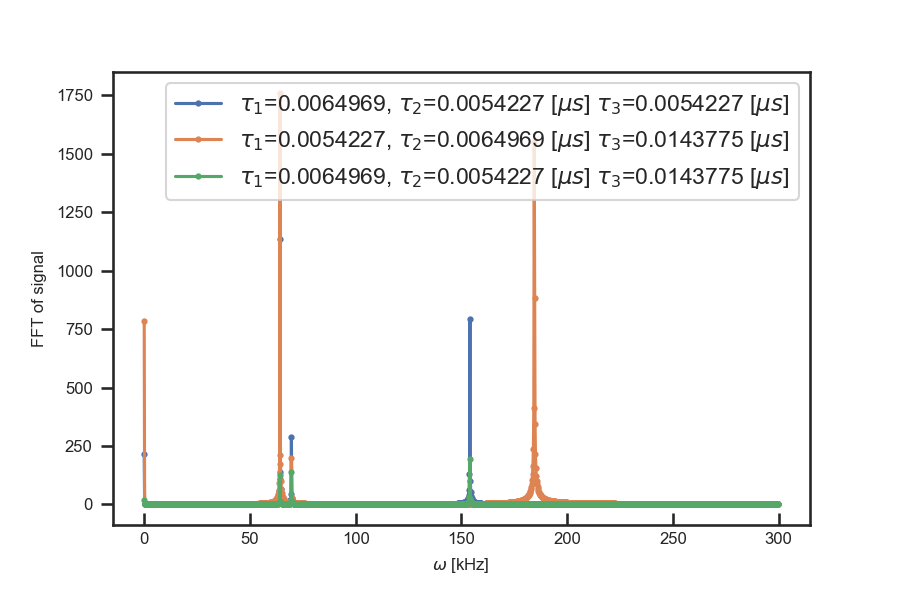

C:\Users\User\AppData\Local\Temp/ipykernel_26692/2591885074.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


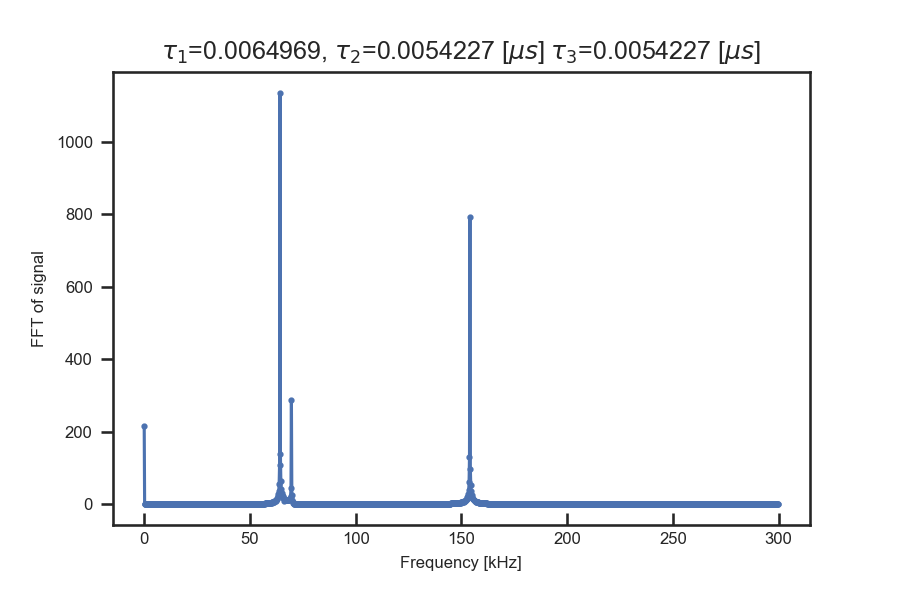

C:\Users\User\AppData\Local\Temp/ipykernel_26692/2591885074.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


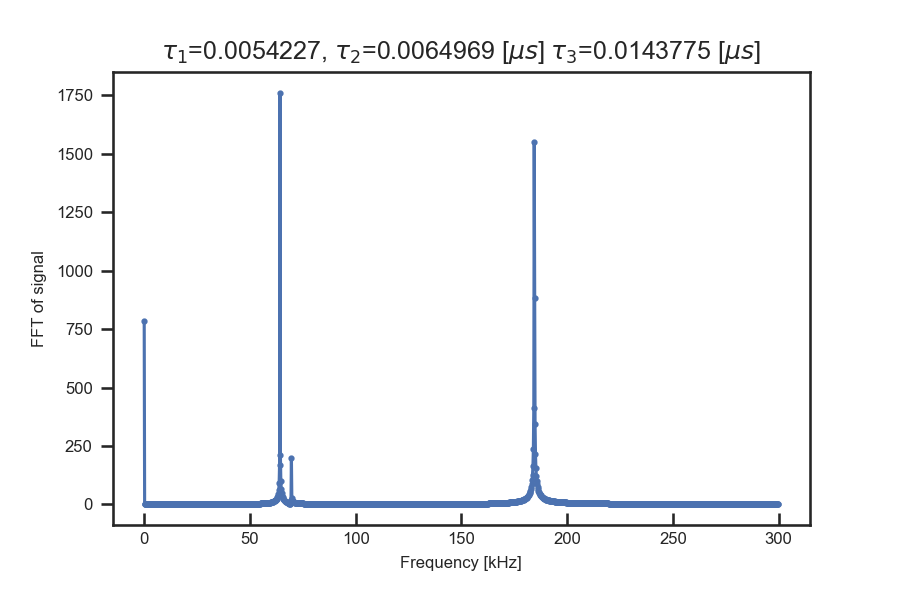

C:\Users\User\AppData\Local\Temp/ipykernel_26692/2591885074.py:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for tc in tqdm.tqdm_notebook(Tc):


  0%|          | 0/3000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


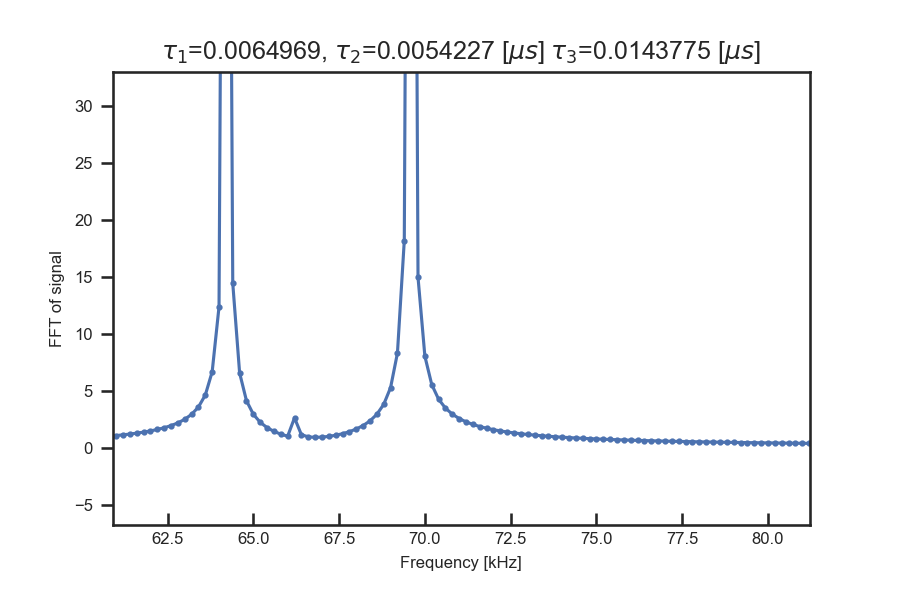

In [93]:
%matplotlib notebook

start = 1e-3 # in ms
duration = 5 # in ms
steps = 3000
Tc = linspace(start,start+duration, steps) # in us
sample_rate = steps/duration # in kHz

print('Freq Larmor={} kHz'.format(fL))
print('Azz={} kHz'.format(Azz))
print('Azx={} kHz'.format(Azx))
print('Freq hyp up={} kHz'.format(Fh_up))
print('Blind Spot up={} ms'.format(BS_up))

fig_all,ax_all = plt.subplots(dpi=150)
for tau1, tau2, tau3 in [[BS_up[0],BS_up[1],BS_up[1]],[BS_up[1],BS_up[0],BS_up[3]],[BS_up[0],BS_up[1],BS_up[3]]]:
    term1 = []
    term2 = []
    term3 = []
    term4 = []
    signal = []    
    for tc in tqdm.tqdm_notebook(Tc):
        term1.append(1)
        term2.append(1)
        term3.append(1)
        term4.append(1)
        for i, azz in enumerate(Azz):
            terms= seq2(2*pi*azz, 2*pi*Azx[i], tau1, tau2, tau3, tc)
            term1[-1] *= terms[0]
            term2[-1] *= terms[1]
            term3[-1] *= terms[2]
            term4[-1] *= terms[3]
        signal.append((term1[-1] - term2[-1] + term3[-1] - term4[-1])/4)

    fig,ax = plt.subplots(dpi=150)
    plt.title(r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7)))
             +r' $\tau_3$={} [$\mu s$]'.format(1e-7*(round(tau3*1e7))))
    ax.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha = 1)
    ax_all.plot(fftfreq(steps, 1/sample_rate)[0:int(steps/2)], np.abs(fft(signal))[0:int(steps/2)],'-o',markersize=2, alpha=1,
                label=r'$\tau_1$={},'.format(1e-7*(round(tau1*1e7)))+r' $\tau_2$={} [$\mu s$]'.format(1e-7*(round(tau2*1e7)))
               +r' $\tau_3$={} [$\mu s$]'.format(1e-7*(round(tau3*1e7))))
    ax.set_xlabel('Frequency [kHz]')
    ax.set_ylabel('FFT of signal')
    
ax_all.set_xlabel(r'$\omega$ [kHz]')
ax_all.set_ylabel('FFT of signal')
ax_all.legend()